# **Heart Attack Risk Prediction**

## **Overview of Problem Statement**
**Relevance of the Problem**

Heart attacks are a leading cause of morbidity and mortality worldwide. Early detection and preventive measures are crucial to reducing the risk of heart attacks. This project aims to develop a machine learning model that can accurately predict the likelihood of an individual experiencing a heart attack based on various health-related metrics and lifestyle factors. By identifying high-risk individuals, timely interventions can be made to improve health outcomes and potentially save lives.

**Problem Definition**

The problem at hand is to predict the likelihood of a heart attack in individuals based on various lifestyle, medical history, and geographic features. The goal is to create a reliable predictive model that can identify high-risk individuals and enable early preventive measures.

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, precision_score, recall_score, f1_score, roc_auc_score
from imblearn.under_sampling import RandomUnderSampler
from imblearn.ensemble import BalancedBaggingClassifier,BalancedRandomForestClassifier
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from lightgbm import LGBMClassifier
from imblearn.over_sampling import ADASYN
from sklearn.neighbors import KNeighborsClassifier

import numpy as np
import pandas as pd
from sklearn.feature_selection import SelectKBest, mutual_info_classif

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB

from imblearn.over_sampling import SMOTE

import xgboost as xgb



# **Objective**

**Goals**

*  To develop a predictive model that can accurately assess the risk of heart attacks in individuals.

*  To identify the most significant features contributing to heart attack risk.

*  To provide insights that can guide healthcare professionals in early diagnosis and intervention.

**Expected Outcomes**

*  A trained machine learning model capable of predicting heart attack risk with high accuracy.

In [ ]:
df = pd.read_csv("/content/heart_attack_prediction_dataset.csv")

In [ ]:
df.head()

,Patient ID,Age,Sex,Cholesterol,Blood Pressure,Heart Rate,Diabetes,Family History,Smoking,Obesity,...,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Continent,Hemisphere,Heart Attack Risk
0,BMW7812,67,Male,208,158/88,72,0,0,1,0,...,6.615001,261404,31.251233,286,0,6,Argentina,South America,Southern Hemisphere,0
1,CZE1114,21,Male,389,165/93,98,1,1,1,1,...,4.963459,285768,27.194973,235,1,7,Canada,North America,Northern Hemisphere,0
2,BNI9906,21,Female,324,174/99,72,1,0,0,0,...,9.463426,235282,28.176571,587,4,4,France,Europe,Northern Hemisphere,0
3,JLN3497,84,Male,383,163/100,73,1,1,1,0,...,7.648981,125640,36.464704,378,3,4,Canada,North America,Northern Hemisphere,0
4,GFO8847,66,Male,318,91/88,93,1,1,1,1,...,1.514821,160555,21.809144,231,1,5,Thailand,Asia,Northern Hemisphere,0


# Dataset Description

The Heart Attack Risk Prediction dataset is designed to facilitate the development of predictive models that assess the likelihood of an individual experiencing a heart attack. This dataset contains various features related to the demographic, lifestyle, medical history, and geographic background of the patients. By analyzing these features, machine learning models can be trained to predict the risk of heart attacks, which can aid in preventive healthcare measures and early intervention strategies.

In [ ]:


df.columns

Index(['Patient ID', 'Age', 'Sex', 'Cholesterol', 'Blood Pressure',
       'Heart Rate', 'Diabetes', 'Family History', 'Smoking', 'Obesity',
       'Alcohol Consumption', 'Exercise Hours Per Week', 'Diet',
       'Previous Heart Problems', 'Medication Use', 'Stress Level',
       'Sedentary Hours Per Day', 'Income', 'BMI', 'Triglycerides',
       'Physical Activity Days Per Week', 'Sleep Hours Per Day', 'Country',
       'Continent', 'Hemisphere', 'Heart Attack Risk'],
      dtype='object')

# **Exploratory Data Analysis (EDA):**

In this section, I analyzed each feature in the dataset to understand their distribution, presence of outliers, and their relationship with the target variable, **Heart Attack Risk.** The following analyses were performed:

In [ ]:

df['Patient ID'].nunique()

8763

In [ ]:
df.shape

(8763, 26)

**Patient ID:** Unique identifier for each patient

In [ ]:
df['Age'].min()

18

In [ ]:
df['Age'].max()

90

In [ ]:
df['Age'].mean()

53.70797672030127

*   In this dataset the age of the patients ranges from 18-95
*   The average age is 54

In [ ]:
# Filter data to include only those with Heart Attack Risk == 1
risk_data = df[df['Heart Attack Risk'] == 1]

# Group filtered data by age and count the number of occurrences
age_risk_grouped = risk_data.groupby('Age').size()

In [ ]:


risk_age = age_risk_grouped.idxmax()
max_risk_count = age_risk_grouped.max()


In [ ]:
risk_age

73

In [ ]:
max_risk_count

56

*   Patients in the 73-year-old age group have the highest risk of heart attack in this dataset. Among them, 56 individuals have a documented risk of heart attack

In [ ]:

no_risk_data = df[df['Heart Attack Risk'] == 0]


age_no_risk_grouped = no_risk_data.groupby('Age').size()

In [ ]:
no_risk_age = age_no_risk_grouped.idxmax()
no_risk_age

33

In [ ]:
no_risk_age_count = age_no_risk_grouped.max()
no_risk_age_count

104

*   Patients in the 33-year-old age group have significantly less risk of heart attack compared to older age groups in this dataset.
*   Among them, 104 individuals are documented to be at low risk for heart attack.

In [ ]:
# Filter data to include only those with Heart Attack Risk == 1
risk_data = df[df['Heart Attack Risk'] == 1]

# Set threshold age as 50
threshold_age = 50

# Calculate the number of individuals with heart attack risk above and below the threshold age
above_threshold = len(risk_data[risk_data['Age'] > threshold_age])
below_threshold = len(risk_data[risk_data['Age'] <= threshold_age])

print("Number of individuals above threshold age (50) who all has highest risk of heart attack:    ", above_threshold)
print("Number of individuals below or equal to threshold age (50) who all has highest risk of heart attack:   ", below_threshold)

Number of individuals above threshold age (50) who all has highest risk of heart attack:     1678
Number of individuals below or equal to threshold age (50) who all has highest risk of heart attack:    1461


*  patients who has the age more than 50 has the high rate of getting heart attack comparing with the patients age less than 50
*  This indicates that while high heart attack risk is present in both age groups, it is slightly more prevalent in individuals over 50. This highlights the increased vulnerability to heart attacks as age progresses.

In [ ]:
# Filter data to include only those with Heart Attack Risk == 0
risk_data = df[df['Heart Attack Risk'] == 0]

# Set threshold age as 50
threshold_age = 50

# Calculate the number of individuals with heart attack risk above and below the threshold age
above_threshold = len(risk_data[risk_data['Age'] > threshold_age])
below_threshold = len(risk_data[risk_data['Age'] <= threshold_age])

print("Number of individuals above threshold age (50) who all has lowest risk of heart attack:    ", above_threshold)
print("Number of individuals below or equal to threshold age (50) who all has lowest risk of heart attack:    ",   below_threshold)

Number of individuals above threshold age (50) who all has lowest risk of heart attack:     3029
Number of individuals below or equal to threshold age (50) who all has lowest risk of heart attack:     2595


*    This indicates that a significant number of people with the lowest heart attack risk are found across both age groups, but there are more older individuals (over 50) who are in the lowest risk category compared to the younger group. This suggests that a substantial portion of the older population maintains good heart health.

**Trend Observations:**

*  While a significant portion of the older population maintains good heart health, a notable number also face the highest risk.
*  The data indicates that age is a critical factor in heart attack risk, with older individuals having a higher likelihood of both the lowest and highest risks.

In [ ]:
df['Sex'].value_counts()

,count
Sex,
Male,6111
Female,2652


In [ ]:
df['Sex'].nunique()

2

In [ ]:
df.columns

Index(['Patient ID', 'Age', 'Sex', 'Cholesterol', 'Blood Pressure',
       'Heart Rate', 'Diabetes', 'Family History', 'Smoking', 'Obesity',
       'Alcohol Consumption', 'Exercise Hours Per Week', 'Diet',
       'Previous Heart Problems', 'Medication Use', 'Stress Level',
       'Sedentary Hours Per Day', 'Income', 'BMI', 'Triglycerides',
       'Physical Activity Days Per Week', 'Sleep Hours Per Day', 'Country',
       'Continent', 'Hemisphere', 'Heart Attack Risk'],
      dtype='object')

In [ ]:
df['Cholesterol'].max()

400

In [ ]:
df['Cholesterol'].min()

120

In [ ]:
normal_cholesterol_limit = 200
Cholesterol_risk = df[df['Cholesterol'] > normal_cholesterol_limit ]

In [ ]:
len(Cholesterol_risk)

6273

*  Out of the Total 8763 values majority of the patients is having high Cholestrol levels

In [ ]:
 len(df[(df['Heart Attack Risk'] == 1) & (df['Cholesterol'] > normal_cholesterol_limit)])

2275

* Out of 6273 patients having  higher Cholestrol levels ,2275 having Heart Attack  Risk

In [ ]:
normal_cholesterol_limit = 200
no_Cholesterol_risk = df[df['Cholesterol'] <= normal_cholesterol_limit ]

In [ ]:
len(no_Cholesterol_risk)

2490

*  In the total dataset 2490 patients have  normal Cholesterol levels

In [ ]:
 len(df[(df['Heart Attack Risk'] == 0) & (df['Cholesterol'] <= normal_cholesterol_limit)])

1626

*  Out of the patients having normal Cholesterol levels 1626 have heart attack risk

*   we can't able to come to a conclusion that patients having high Cholesterol levels only having heart attack risk
*  Because patients having normal Cholesterol level also having heart attack risk

In [ ]:
df['Blood Pressure']

,Blood Pressure
0,158/88
1,165/93
2,174/99
3,163/100
4,91/88
5,172/86
6,102/73
7,131/68
8,144/105
9,160/70



*  Because this column is of patients  BP this columns values are in this format num/num so we need to change this and make this suitable for analysis and model training


In [ ]:
df[['systolic_bp','diastolic_bp']] = df['Blood Pressure'].str.split('/',expand=True)

In [ ]:
df['systolic_bp'] = pd.to_numeric(df['systolic_bp'])

In [ ]:
df['diastolic_bp'] = pd.to_numeric(df['diastolic_bp'])

In [ ]:
df['systolic_bp'].max()

180

In [ ]:
df['systolic_bp'].min()

90

In [ ]:
df['diastolic_bp'].min()

60

In [ ]:
df['diastolic_bp'].max()

110

In [ ]:
normal_bp_systolic = 130
normal_bp_diastolic = 85

In [ ]:
high_bp = df[(df['systolic_bp'] > normal_bp_systolic) & (df['diastolic_bp']> normal_bp_diastolic)]

In [ ]:
len(high_bp)

2411

In [ ]:
len(high_bp[high_bp['Heart Attack Risk']==1])

859

* A total of 2411 individuals have been diagnosed with high blood pressure, defined as having systolic blood pressure greater than the normal threshold (120 mmHg) and diastolic blood pressure greater than the normal threshold (80 mmHg).

*  Among those with high blood pressure, 859 individuals are also at the highest risk of heart attack.






*  The analysis reveals a substantial overlap between high blood pressure and high heart attack risk within the dataset. Specifically, a portion of individuals with high blood pressure are also at the highest risk for heart attacks. This underscores the critical need for managing blood pressure to potentially reduce the risk of heart attacks, emphasizing the importance of integrated cardiovascular health management.

In [ ]:
low_systolic_threshold = 90
low_diastolic_threshold = 60

In [ ]:
low_bp = df[(df['systolic_bp'] < low_systolic_threshold) & (df['diastolic_bp'] < low_diastolic_threshold)]


In [ ]:
len(low_bp)

0

*  In this dataset there is no patients has low bp

In [ ]:
normal_bp = df[(df['systolic_bp'] >= 90) & (df['systolic_bp'] <= 120) & (df['diastolic_bp'] >= 60) & (df['diastolic_bp'] <= 80)]


In [ ]:
len(normal_bp)

1265

In [ ]:
len(normal_bp[normal_bp['Heart Attack Risk']==1])

451

*  There are 1265 individuals in the dataset who have normal blood pressure, defined as systolic BP between 90 and 120 mmHg and diastolic BP between 60 and 80 mmHg.

*  Within the normal blood pressure group, 451 individuals are identified to have the highest risk of heart attack (Heart Attack Risk == 1)

*  The analysis highlights that a significant portion of individuals with normal blood pressure are still at risk for heart attacks. Despite having blood pressure within the normal range, approximately 35.6% of individuals in this group exhibit the highest risk of heart attack.

In [ ]:
df.columns

Index(['Patient ID', 'Age', 'Sex', 'Cholesterol', 'Blood Pressure',
       'Heart Rate', 'Diabetes', 'Family History', 'Smoking', 'Obesity',
       'Alcohol Consumption', 'Exercise Hours Per Week', 'Diet',
       'Previous Heart Problems', 'Medication Use', 'Stress Level',
       'Sedentary Hours Per Day', 'Income', 'BMI', 'Triglycerides',
       'Physical Activity Days Per Week', 'Sleep Hours Per Day', 'Country',
       'Continent', 'Hemisphere', 'Heart Attack Risk', 'systolic_bp',
       'diastolic_bp'],
      dtype='object')

In [ ]:
df['Heart Rate'].max()

110

In [ ]:
df['Heart Rate'].min()

40

In [ ]:
normal_hr_lower = 60
normal_hr_upper = 100

In [ ]:
normal_hr = df[(df['Heart Rate']>=60) & (df['Heart Rate'] <=100)]

In [ ]:
len(normal_hr)

5040

In [ ]:
len(normal_hr[normal_hr['Heart Attack Risk']==1])

1786

*  There are 5040 individuals in the dataset with a normal resting heart rate, defined as between 60 and 100 beats per minute (bpm).

*  Among the individuals with a normal heart rate, 1786 individuals are identified as having the highest risk of heart attack (Heart Attack Risk == 1).

In [ ]:
high_risk_hr = df[df['Heart Rate']>100]

In [ ]:
len(high_risk_hr)

1234

In [ ]:
len(high_risk_hr[high_risk_hr['Heart Attack Risk']==1])

447

* There are 1234 individuals in the dataset with an elevated heart rate (above 100 bpm).
Within this elevated heart rate group, 447 individuals are identified as having the highest risk of heart attack.

*  A significant portion of individuals with a normal heart rate (approximately 35.4%) are still at high risk of heart attack. This indicates that heart rate alone is not sufficient to rule out cardiovascular risk.
*  In the elevated heart rate group, about 36.2% are at high risk for heart attack. This underscores the importance of monitoring heart rate as a potential indicator of cardiovascular stress and risk.

Overall, while normal heart rate is a good indicator of general cardiovascular health, it is crucial to consider additional risk factors and indicators to accurately assess heart attack risk

In [ ]:
df.columns

Index(['Patient ID', 'Age', 'Sex', 'Cholesterol', 'Blood Pressure',
       'Heart Rate', 'Diabetes', 'Family History', 'Smoking', 'Obesity',
       'Alcohol Consumption', 'Exercise Hours Per Week', 'Diet',
       'Previous Heart Problems', 'Medication Use', 'Stress Level',
       'Sedentary Hours Per Day', 'Income', 'BMI', 'Triglycerides',
       'Physical Activity Days Per Week', 'Sleep Hours Per Day', 'Country',
       'Continent', 'Hemisphere', 'Heart Attack Risk', 'systolic_bp',
       'diastolic_bp'],
      dtype='object')

In [ ]:
df['Diabetes'].min()

0

In [ ]:
df['Diabetes'].max()

1

In [ ]:
df['Diabetes'].dtype

dtype('int64')

In [ ]:
df['Diabetes']

,Diabetes
0,0
1,1
2,1
3,1
4,1
5,1
6,0
7,0
8,1
9,0


*  0 indicates no Diabetes
*  1 indicates  patient has Diabetes

<Axes: xlabel='Diabetes', ylabel='count'>

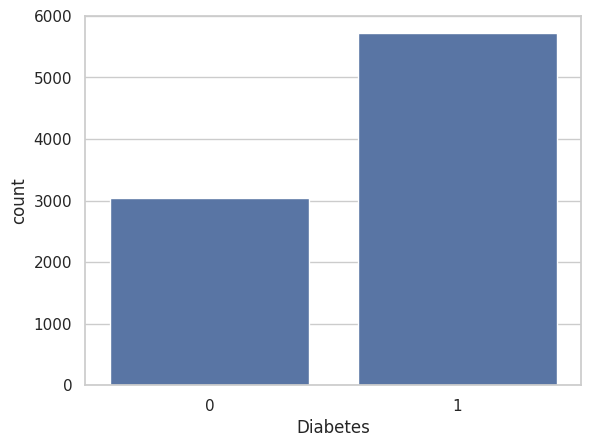

In [ ]:
sns.countplot(x='Diabetes',data=df)

In [ ]:
len(df[(df['Diabetes']==1) & (df['Heart Attack Risk']==1)])

2082

In [ ]:
len(df[df['Diabetes']==1])

5716

*  Out of the entire dataset, 5716 individuals have diabetes.
*  Among these individuals with diabetes, 2082 individuals are identified as having the highest risk of heart attack (Heart Attack Risk == 1).

In [ ]:
len(df[df['Diabetes']==0])

3047

In [ ]:
len(df[(df['Diabetes']==0) & (df['Heart Attack Risk']==1)])

1057

*  There are 3047 individuals in the dataset who do not have diabetes.
*  Among these non-diabetic individuals, 1057 individuals are identified as having the highest risk of heart attack (Heart Attack Risk == 1).

*  A substantial proportion of individuals with diabetes (approximately 36.4%) are at the highest risk of heart attack. This highlights the heightened cardiovascular risk associated with diabetes and underscores the importance of rigorous cardiovascular monitoring and preventive measures in diabetic patients.
*  Among individuals without diabetes, a lower but still significant proportion (approximately 34.7%) are at the highest risk of heart attack. This suggests that while diabetes is a significant risk factor, there are also other critical factors contributing to heart attack risk in non-diabetic individuals.

In [ ]:
df.columns

Index(['Patient ID', 'Age', 'Sex', 'Cholesterol', 'Blood Pressure',
       'Heart Rate', 'Diabetes', 'Family History', 'Smoking', 'Obesity',
       'Alcohol Consumption', 'Exercise Hours Per Week', 'Diet',
       'Previous Heart Problems', 'Medication Use', 'Stress Level',
       'Sedentary Hours Per Day', 'Income', 'BMI', 'Triglycerides',
       'Physical Activity Days Per Week', 'Sleep Hours Per Day', 'Country',
       'Continent', 'Hemisphere', 'Heart Attack Risk', 'systolic_bp',
       'diastolic_bp'],
      dtype='object')

In [ ]:
df['Family History']

,Family History
0,0
1,1
2,0
3,1
4,1
5,1
6,0
7,0
8,0
9,1


In [ ]:
df['Family History'].value_counts()

,count
Family History,
0,4443
1,4320


In [ ]:
len(df[(df['Family History']==1) & (df['Heart Attack Risk']==1)])

1544

In [ ]:
len(df[(df['Family History']==1) & (df['Heart Attack Risk']==0)])

2776

*  Of the 4,320 individuals with a family history of heart disease, 1,544 (approximately 35.7%) are at risk of heart attacks.
*  The remaining 2,776 individuals with a family history are not at risk, accounting for about 64.3%.

*  The analysis underscores the importance of family history as a critical factor in assessing heart attack risk. The data reveals that a substantial portion of individuals with a family history of heart disease are at risk, emphasizing the need for targeted health strategies to mitigate this risk. By integrating family history into heart attack prediction models, healthcare providers can better identify and support high-risk individuals, ultimately aiming to reduce the incidence and impact of heart attacks.

In [ ]:
df['Smoking']

,Smoking
0,1
1,1
2,0
3,1
4,1
5,1
6,1
7,1
8,1
9,1


In [ ]:
df['Smoking'].value_counts()

,count
Smoking,
1,7859
0,904


In [ ]:
len(df[(df['Smoking']==1) & (df['Heart Attack Risk']==1)])

2810

*  Of the 7,859 smokers, 2,810 (approximately 35.7%) are at risk of heart attacks.
*  This highlights the significant impact of smoking on heart attack risk.

In [ ]:
len(df[(df['Smoking']==0) & (df['Heart Attack Risk']==1)])

329


*  Among the 904 non-smokers, 329 (approximately 36.4%) are at risk of heart attacks.
*   While the absolute number of non-smokers at risk is lower, the proportion is comparable to that of smokers.

*  The data indicates that smoking is strongly associated with an increased number of heart attack risks, reinforcing its role as a major modifiable risk factor.

In [ ]:
df.columns

Index(['Patient ID', 'Age', 'Sex', 'Cholesterol', 'Blood Pressure',
       'Heart Rate', 'Diabetes', 'Family History', 'Smoking', 'Obesity',
       'Alcohol Consumption', 'Exercise Hours Per Week', 'Diet',
       'Previous Heart Problems', 'Medication Use', 'Stress Level',
       'Sedentary Hours Per Day', 'Income', 'BMI', 'Triglycerides',
       'Physical Activity Days Per Week', 'Sleep Hours Per Day', 'Country',
       'Continent', 'Hemisphere', 'Heart Attack Risk', 'systolic_bp',
       'diastolic_bp'],
      dtype='object')

In [ ]:
df['Obesity']

,Obesity
0,0
1,1
2,0
3,0
4,1
5,0
6,0
7,1
8,1
9,1


*  Obesity is often defined based on body mass index (BMI), where a BMI value above a certain threshold (commonly 30) indicates obesity. This condition is associated with various health risks, including cardiovascular diseases like heart attacks, which aligns with the focus of your project on predicting heart attack risk.

In [ ]:
df['Obesity'].value_counts()

,count
Obesity,
1,4394
0,4369


In [ ]:
len(df[(df['Obesity']==1) & (df['Heart Attack Risk']==1)])

1546

**Obese Individuals:**

*  Total: 4394
*  High Heart Attack Risk: 1546 (approximately 35.2%)

In [ ]:
len(df[(df['Obesity']==0) & (df['Heart Attack Risk']==1)])

1593

**Non-Obese Individuals:**

*  Total: 4369
*  High Heart Attack Risk: 1593 (approximately 36.5%)

*  Both obese and non-obese individuals show a significant proportion at the highest risk of heart attack, highlighting the multifactorial nature of cardiovascular risk

In [ ]:
df['Alcohol Consumption']

,Alcohol Consumption
0,0
1,1
2,0
3,1
4,0
5,1
6,1
7,1
8,0
9,1


In [ ]:
df['Alcohol Consumption'].value_counts()

,count
Alcohol Consumption,
1,5241
0,3522


In [ ]:
len(df[(df['Alcohol Consumption']==1) & df['Heart Attack Risk']==1])

1849

<ipython-input-540-2c74104c67dd>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  plot = sns.countplot(x='Alcohol Consumption', data=df, palette={'0': 'red', '1': 'green'})


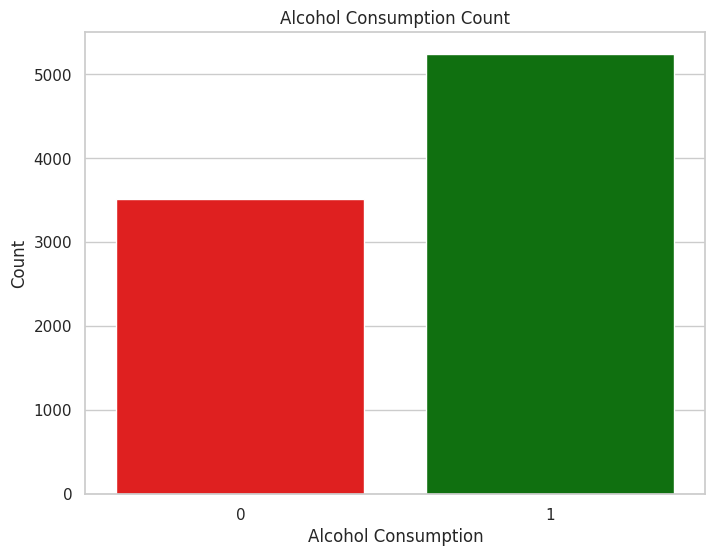

In [ ]:
plt.figure(figsize=(8, 6))

# Define the palette with the correct keys
plot = sns.countplot(x='Alcohol Consumption', data=df, palette={'0': 'red', '1': 'green'})
plt.title('Alcohol Consumption Count')
plt.xlabel('Alcohol Consumption')
plt.ylabel('Count')
plt.show()


**Alcohol Consumers:**

* Total: 5241
*  High Heart Attack Risk: 1849 (approximately 35.3%)

In [ ]:
len(df[(df['Alcohol Consumption']==0) & df['Heart Attack Risk']==1])

1290

**Non-Alcohol Consumers:**

*  Total: 3522
*  High Heart Attack Risk: 1290 (approximately 36.6%)

*  Both alcohol consumers and non-consumers show a significant proportion at the highest risk of heart attack, suggesting that alcohol consumption alone does not eliminate the risk of cardiovascular events.
*  Despite differences in alcohol consumption habits, both groups exhibit a considerable prevalence of individuals at high risk for heart attacks,

In [ ]:
df['Exercise Hours Per Week']

,Exercise Hours Per Week
0,4.168189
1,1.813242
2,2.078353
3,9.828130
4,5.804299
5,0.625008
6,4.098177
7,3.427929
8,16.868302
9,0.194515


In [ ]:
df['Exercise Hours Per Week'].min()

0.0024423483189783

In [ ]:
df['Exercise Hours Per Week'].max()

19.998709051535457

In [ ]:
df['Exercise Hours Per Week'] = df['Exercise Hours Per Week'].round(3)

In [ ]:
df['Exercise Hours Per Week'].max()

19.999

*  .round() Function: This function rounds each value in the specified column to the number of decimal places provided (2 or 3 in this case).

*  Preservation of Floats: The values remain as floats but with reduced decimal precision. This allows us to maintain some level of accuracy in recording exercise hours while controlling the display or analysis precision.

<Axes: title={'center': 'Exercise Hours Per Week'}, ylabel='Exercise Hours Per Week'>

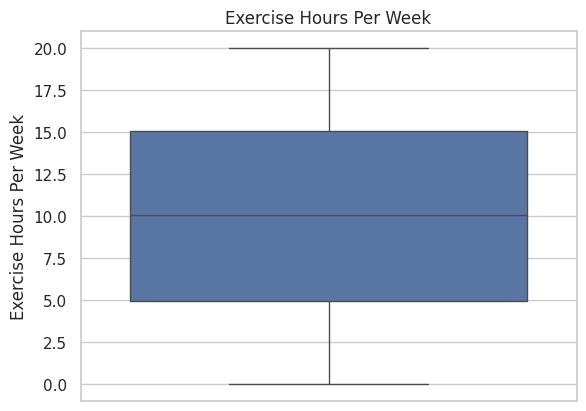

In [ ]:
plt.title('Exercise Hours Per Week')
sns.boxplot(df['Exercise Hours Per Week'])

*  There is no outliers in this column the data is properly distributed in this column

In [ ]:
df.columns

Index(['Patient ID', 'Age', 'Sex', 'Cholesterol', 'Blood Pressure',
       'Heart Rate', 'Diabetes', 'Family History', 'Smoking', 'Obesity',
       'Alcohol Consumption', 'Exercise Hours Per Week', 'Diet',
       'Previous Heart Problems', 'Medication Use', 'Stress Level',
       'Sedentary Hours Per Day', 'Income', 'BMI', 'Triglycerides',
       'Physical Activity Days Per Week', 'Sleep Hours Per Day', 'Country',
       'Continent', 'Hemisphere', 'Heart Attack Risk', 'systolic_bp',
       'diastolic_bp'],
      dtype='object')

In [ ]:
df['Diet'].value_counts()

,count
Diet,
Healthy,2960
Average,2912
Unhealthy,2891


<ipython-input-550-baaf6b63e80f>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Diet',data=df,palette=['green','orange','red'])


Text(0.5, 1.0, 'count of the diet types')

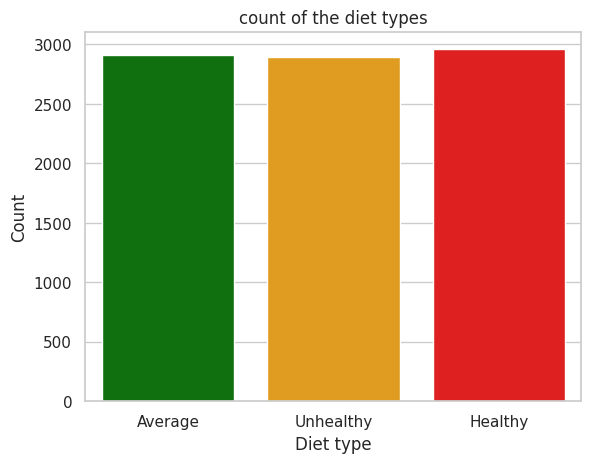

In [ ]:
sns.set(style='whitegrid')
sns.countplot(x='Diet',data=df,palette=['green','orange','red'])
plt.xlabel('Diet type')
plt.ylabel('Count')
plt.title('count of the diet types')

In [ ]:
Healthy_diet_risk=len(df[(df['Diet']=='Healthy') & (df['Heart Attack Risk']==1)])

In [ ]:
Average_diet_risk=len(df[(df['Diet']=='Average') & (df['Heart Attack Risk']==1)])

In [ ]:
unhealthy_diet_risk=len(df[(df['Diet']=='Unhealthy') & (df['Heart Attack Risk']==1)])

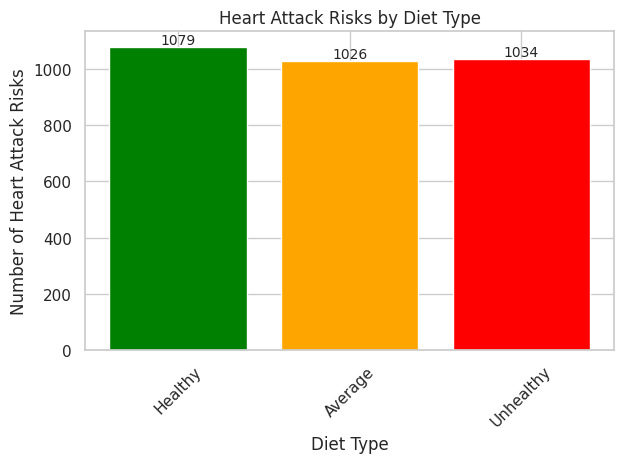

In [ ]:
categories = ['Healthy', 'Average', 'Unhealthy']
risks = [Healthy_diet_risk, Average_diet_risk, unhealthy_diet_risk]

bars = plt.bar(categories, risks, color=['green', 'orange', 'red'])

# Adding annotations with counts on top of each bar
for bar, risk in zip(bars, risks):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
             str(risk), ha='center', va='bottom', fontsize=10)

plt.xlabel('Diet Type')
plt.ylabel('Number of Heart Attack Risks')
plt.title('Heart Attack Risks by Diet Type')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
df['Previous Heart Problems'].value_counts()

,count
Previous Heart Problems,
0,4418
1,4345


<ipython-input-556-08684d5475fd>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  plot = sns.countplot(x='Previous Heart Problems', data=df, palette={'0': 'pink', '1': 'yellow'})


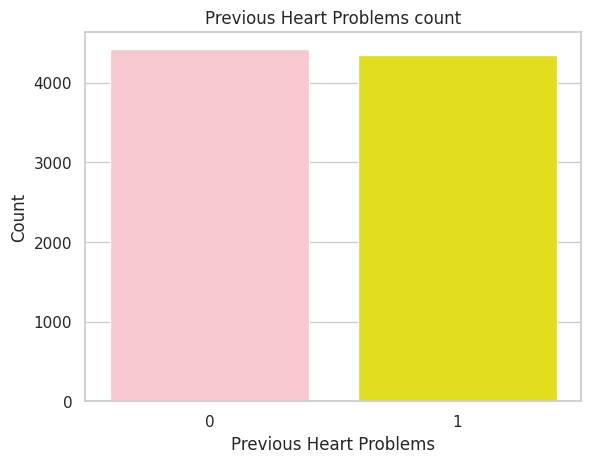

In [ ]:
# Define the palette with the correct keys
plot = sns.countplot(x='Previous Heart Problems', data=df, palette={'0': 'pink', '1': 'yellow'})
plt.title('Previous Heart Problems count')
plt.xlabel('Previous Heart Problems')
plt.ylabel('Count')
plt.show()


In [ ]:
Previous_Heart_risk = len(df[(df['Previous Heart Problems']==1) & (df['Heart Attack Risk']==1)])

*   Individuals with Previous Heart Problems: 35.8% (1557 out of 4345) experienced a heart attack.

In [ ]:
without_previous_heart_risk=len(df[(df['Previous Heart Problems']==0) & (df['Heart Attack Risk']==1)])

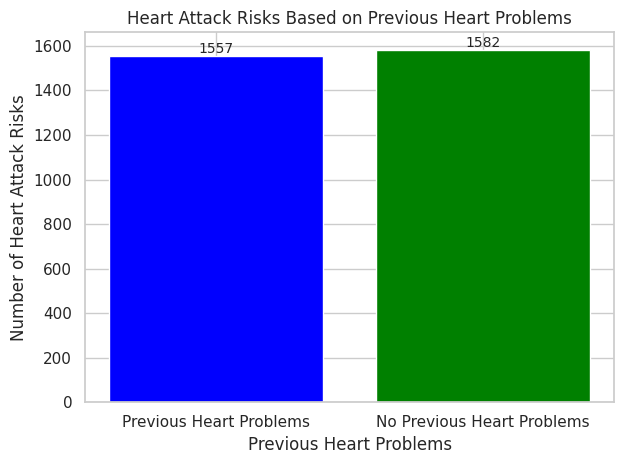

In [ ]:
categories = ['Previous Heart Problems', 'No Previous Heart Problems']
risks = [Previous_Heart_risk,without_previous_heart_risk]
# Plotting the bars
bars = plt.bar(categories, risks, color=['blue', 'green'])

for bar,risk in zip(bars,risks):
  plt.text(bar.get_x()+ bar.get_width() / 2, bar.get_height(),str(risk),ha='center',va='bottom',fontsize=10)

plt.xlabel('Previous Heart Problems')
plt.ylabel('Number of Heart Attack Risks')
plt.title('Heart Attack Risks Based on Previous Heart Problems')
plt.tight_layout()
plt.show()

*  Individuals without Previous Heart Problems: 35.8% (1582 out of 4418) experienced a heart attack.

*  The data shows that previous heart problems are not significantly associated with a higher or lower risk of heart attacks, as the proportions are nearly identical for both groups. Further analysis incorporating other variables (such as diet, exercise, age, etc.) might provide a more comprehensive understanding of the risk factors for heart attacks.

In [ ]:
df.columns

Index(['Patient ID', 'Age', 'Sex', 'Cholesterol', 'Blood Pressure',
       'Heart Rate', 'Diabetes', 'Family History', 'Smoking', 'Obesity',
       'Alcohol Consumption', 'Exercise Hours Per Week', 'Diet',
       'Previous Heart Problems', 'Medication Use', 'Stress Level',
       'Sedentary Hours Per Day', 'Income', 'BMI', 'Triglycerides',
       'Physical Activity Days Per Week', 'Sleep Hours Per Day', 'Country',
       'Continent', 'Hemisphere', 'Heart Attack Risk', 'systolic_bp',
       'diastolic_bp'],
      dtype='object')

In [ ]:
df['Medication Use']

,Medication Use
0,0
1,0
2,1
3,0
4,0
5,1
6,0
7,1
8,0
9,0


<ipython-input-562-c47e0a14bf33>:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  plot = sns.countplot(x='Medication Use', data=df, palette=['Black', 'Red'])


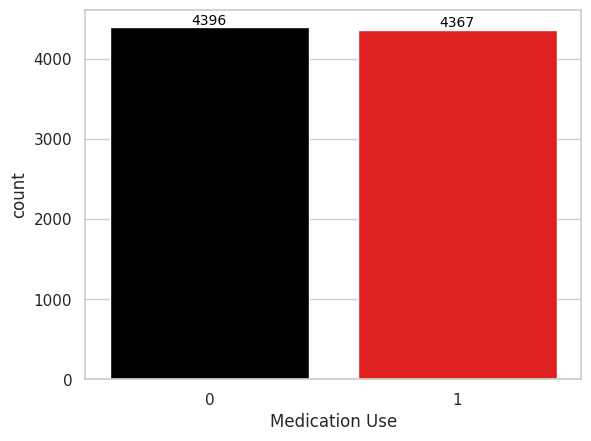

In [ ]:
plot = sns.countplot(x='Medication Use', data=df, palette=['Black', 'Red'])

for p in plot.patches:
    plot.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2, p.get_height()),
                ha='center', va='bottom', fontsize=10, color='black')
plt.show()

In [ ]:
len(df[(df['Medication Use']==1) & (df['Heart Attack Risk']==1)])

1569

In [ ]:
len(df[(df['Medication Use']==0) & (df['Heart Attack Risk']==1)])

1570

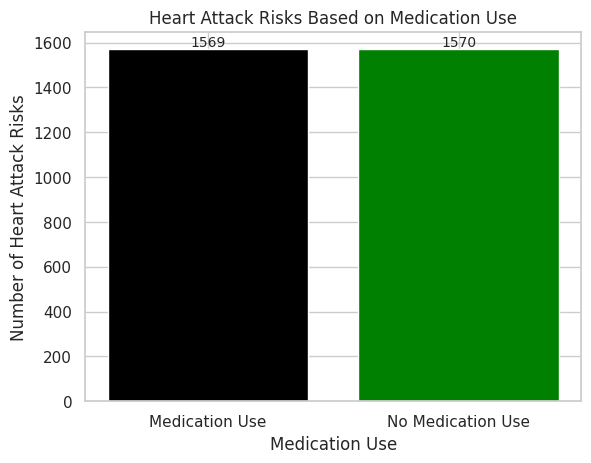

In [ ]:
risks = [len(df[(df['Medication Use']==1) & (df['Heart Attack Risk']==1)]),len(df[(df['Medication Use']==0) & (df['Heart Attack Risk']==1)])]
categories = ['Medication Use', 'No Medication Use']

plot = plt.bar(categories,risks,color=['black','green'])

for bar,risk in zip(plot,risks):
  plt.text(bar.get_x() + bar.get_width() / 2,bar.get_height(),str(risk),ha='center',va='bottom',fontsize=10)
plt.xlabel('Medication Use')
plt.ylabel('Number of Heart Attack Risks')
plt.title('Heart Attack Risks Based on Medication Use')
plt.show()


The data shows that Medication usage is not  significantly associated with a higher or lower risk of heart attacks, as the proportions are nearly identical for both groups. Further analysis incorporating other variables (such as diet, exercise, age, etc.) might provide a more comprehensive understanding of the risk factors for heart attacks.

In [ ]:
df.columns

Index(['Patient ID', 'Age', 'Sex', 'Cholesterol', 'Blood Pressure',
       'Heart Rate', 'Diabetes', 'Family History', 'Smoking', 'Obesity',
       'Alcohol Consumption', 'Exercise Hours Per Week', 'Diet',
       'Previous Heart Problems', 'Medication Use', 'Stress Level',
       'Sedentary Hours Per Day', 'Income', 'BMI', 'Triglycerides',
       'Physical Activity Days Per Week', 'Sleep Hours Per Day', 'Country',
       'Continent', 'Hemisphere', 'Heart Attack Risk', 'systolic_bp',
       'diastolic_bp'],
      dtype='object')

In [ ]:
stress_counts=df['Stress Level'].value_counts().sort_index()

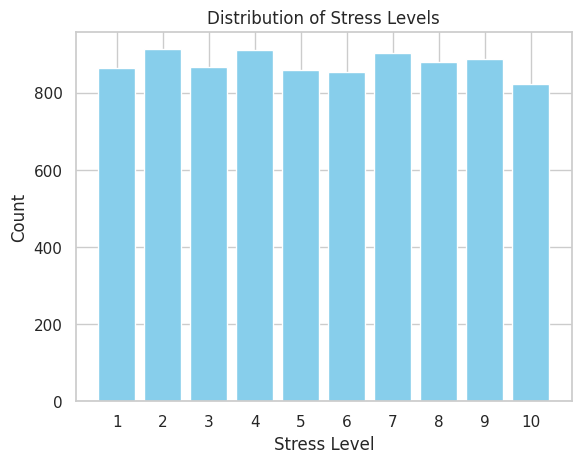

In [ ]:

plt.bar(stress_counts.index, stress_counts.values, color='skyblue')

# Adding labels and title
plt.xlabel('Stress Level')
plt.ylabel('Count')
plt.title('Distribution of Stress Levels')
plt.xticks(range(1, 11))


plt.show()


In [ ]:
high_stress_level = df[(df['Stress Level']>=7) & (df['Stress Level']<=10)]
len(high_stress_level)

3492

In [ ]:
high_stress=len(high_stress_level[high_stress_level['Heart Attack Risk']==1])
high_stress

1237

*  **Definition:** Stress Level between 7 and 10
*  **Total Number of Individuals:** 3492
*  **Number of Individuals at Risk:** 1237
*  **Implication:** There is a notable increase in the number of individuals at risk of heart attacks in the high-stress category. This indicates a strong correlation between high stress levels and the likelihood of heart attack risk. Approximately 35.4% of individuals with high stress are at risk.

In [ ]:

low_stress_level = df[(df['Stress Level']>=1) & (df['Stress Level']<=3)]
len(low_stress_level)

2646

In [ ]:
low_stress=len(low_stress_level[low_stress_level['Heart Attack Risk']==1])
low_stress

950

*  **Definition:**Stress Level between 1 and 3
*  **Total Number of Individuals:** 2346
*  **Number of Individuals at Risk:** 950
*  **Implication:** Even individuals with low stress levels are not entirely free from heart attack risk, highlighting that stress is only one of many contributing factors to heart health.

In [ ]:
moderate_stress_level = df[(df['Stress Level']>=4) & (df['Stress Level']<=6)]
len(moderate_stress_level)

2625

In [ ]:
moderate_stress=len(moderate_stress_level[moderate_stress_level['Heart Attack Risk']==1])
moderate_stress

952

*  **Definition:** Stress Level between 4 and 6
*  **Total Number of Individuals:** 2625
*  **Number of Individuals at Risk:** 950
*  **Implication:** The number of individuals at risk remains consistent with those in the low-stress category, suggesting that moderate stress does not significantly increase the risk of heart attacks compared to low stress.

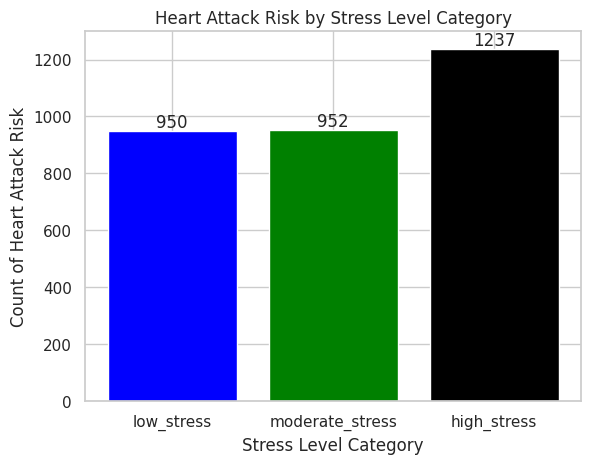

In [ ]:
cat = ['low_stress', 'moderate_stress', 'high_stress']
risk = [low_stress, moderate_stress, high_stress]

# Plotting the bar chart
bars=plt.bar(cat, risk, color=['blue', 'green', 'black'])

# Adding labels and title
plt.xlabel('Stress Level Category')
plt.ylabel('Count of Heart Attack Risk')
plt.title('Heart Attack Risk by Stress Level Category')

for bar,risk in zip(bars,risk):
  height= bar.get_height()
  plt.text(bar.get_x() + bar.get_width()/2,height,str(risk),ha='center',va='bottom')
plt.show()

**Conclusion:**
The analysis demonstrates a clear relationship between stress levels and heart attack risk:

*  **Low and Moderate Stress:** Both categories have a similar number of individuals at risk, indicating that moderate stress does not significantly increase heart attack risk compared to low stress. However, a high proportion of individuals in these categories are at risk, showing that any level of stress can be dangerous..
*  **High Stress**: There is a significant increase in heart attack risk among individuals with high stress levels. Although the percentage of at-risk individuals is slightly lower than in the low and moderate categories, the absolute number of at-risk individuals is highest in the high stress group. This underscores the need for stress management interventions.
"

In [ ]:
df.columns

Index(['Patient ID', 'Age', 'Sex', 'Cholesterol', 'Blood Pressure',
       'Heart Rate', 'Diabetes', 'Family History', 'Smoking', 'Obesity',
       'Alcohol Consumption', 'Exercise Hours Per Week', 'Diet',
       'Previous Heart Problems', 'Medication Use', 'Stress Level',
       'Sedentary Hours Per Day', 'Income', 'BMI', 'Triglycerides',
       'Physical Activity Days Per Week', 'Sleep Hours Per Day', 'Country',
       'Continent', 'Hemisphere', 'Heart Attack Risk', 'systolic_bp',
       'diastolic_bp'],
      dtype='object')

In [ ]:
df['Sedentary Hours Per Day']

,Sedentary Hours Per Day
0,6.615001
1,4.963459
2,9.463426
3,7.648981
4,1.514821
5,7.798752
6,0.627356
7,10.543780
8,11.348787
9,4.055115


*  The column "Sedentary Hours Per Day" likely represents the amount of time individuals spend in sedentary activities each day. Sedentary behavior generally refers to activities that involve low levels of physical activity and energy expenditure, typically involving sitting or lying down. Examples include working at a desk, watching television, or using a computer for extended periods without physical movement.

In [ ]:
df['Sedentary Hours Per Day'].max()

11.999313410370352

In [ ]:
df['Sedentary Hours Per Day'].min()

0.0012632057782457

In [ ]:
df['Sedentary Hours Per Day'] = df['Sedentary Hours Per Day'].round(4)

In [ ]:
df['Sedentary Hours Per Day'].max()

11.9993

In [ ]:
low_sedentary_hours =  df[(df['Sedentary Hours Per Day']>=0) & (df['Sedentary Hours Per Day']<=4)]
len(low_sedentary_hours)

2919

In [ ]:
low_sedentary_risk = len(low_sedentary_hours[low_sedentary_hours['Heart Attack Risk']==1])
low_sedentary_risk

1048

**Low Sedentary Risk (0-4 hours/day):**

*  **Total Number of Individuals:** 2919
*  **Number of Individuals at Risk of Heart Attack:** 1048
*  **Implication:** About 35.9% of individuals in this category are at risk of heart attacks. Despite having relatively low sedentary hours, a significant proportion still faces heart attack risk, indicating that even lower levels of inactivity can be harmful.

In [ ]:
moderate_sedentary_hours =  df[(df['Sedentary Hours Per Day']>=5) & (df['Sedentary Hours Per Day']<=7)]
len(moderate_sedentary_hours)

1500

In [ ]:
moderate_sedentary_risk = len(moderate_sedentary_hours[moderate_sedentary_hours['Heart Attack Risk']==1])
moderate_sedentary_risk

523

**Moderate Sedentary Risk (5-7 hours/day):**

*  **Total Number of Individuals:** 1500
*  **Number of Individuals at Risk of Heart Attack:** 523
*  **Implication:** Approximately 34.9% of individuals in this category are at risk of heart attacks. The risk remains high, suggesting that increasing sedentary hours to moderate levels does not substantially reduce heart attack risk.

In [ ]:
high_sedentary_hours =   df[(df['Sedentary Hours Per Day']>=8) & (df['Sedentary Hours Per Day']<=12)]
len(high_sedentary_hours)

2897

In [ ]:
high_sedentary_risk =  len(high_sedentary_hours[high_sedentary_hours['Heart Attack Risk']==1])
high_sedentary_risk

1037

**High Sedentary Risk (8-12 hours/day):**

*  **Total Number of Individuals:** 2897
*  **Number of Individuals at Risk of Heart Attack**: 1037
*  **Implication:** Around 36% of people in this group are at risk of heart attacks, highlighting the serious impact of prolonged inactivity on heart health.







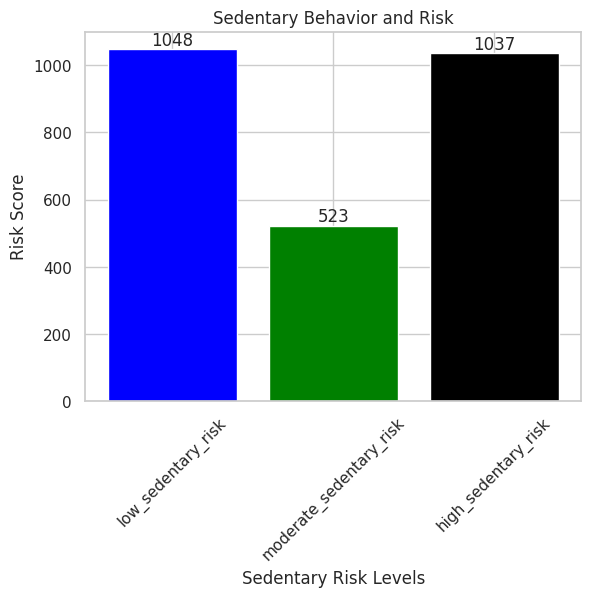

In [ ]:
# Example data
cat = ['low_sedentary_risk', 'moderate_sedentary_risk', 'high_sedentary_risk']
risk = [low_sedentary_risk, moderate_sedentary_risk, high_sedentary_risk]



bars = plt.bar(cat, risk, color=['blue', 'green', 'black'])


plt.xlabel('Sedentary Risk Levels')
plt.ylabel('Risk Score')
plt.title('Sedentary Behavior and Risk')
plt.xticks(rotation=45)


for bar, risk in zip(bars, risk):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, str(risk), ha='center', va='bottom')


plt.show()


**Conclusion:**

The analysis reveals a consistent and significant risk of heart attacks across all levels of sedentary behavior. Whether individuals have low, moderate, or high sedentary hours, the proportion of those at risk remains high (around 35-36%). This underscores the critical need for interventions to reduce sedentary behavior and promote more active lifestyles to mitigate heart attack risk.

In [ ]:
df.columns

Index(['Patient ID', 'Age', 'Sex', 'Cholesterol', 'Blood Pressure',
       'Heart Rate', 'Diabetes', 'Family History', 'Smoking', 'Obesity',
       'Alcohol Consumption', 'Exercise Hours Per Week', 'Diet',
       'Previous Heart Problems', 'Medication Use', 'Stress Level',
       'Sedentary Hours Per Day', 'Income', 'BMI', 'Triglycerides',
       'Physical Activity Days Per Week', 'Sleep Hours Per Day', 'Country',
       'Continent', 'Hemisphere', 'Heart Attack Risk', 'systolic_bp',
       'diastolic_bp'],
      dtype='object')

In [ ]:




df['BMI']

,BMI
0,31.251233
1,27.194973
2,28.176571
3,36.464704
4,21.809144
5,20.146840
6,28.885811
7,22.221862
8,35.809901
9,22.558917


In [ ]:


df['BMI'].max()

39.99721081557256

In [ ]:
under_weight=df[df['BMI']<=18.5]
len(under_weight)

204

In [ ]:
normal_weight = df[(df['BMI']>=18.5)  & (df['BMI']<=24.9)]
len(normal_weight)

2581

In [ ]:
over_weight = df[(df['BMI']>=25)  & (df['BMI']<=29.9)]
len(over_weight)

2024

In [ ]:
obesity_bmi = df[df['BMI']>=30]
len(obesity_bmi)

3881

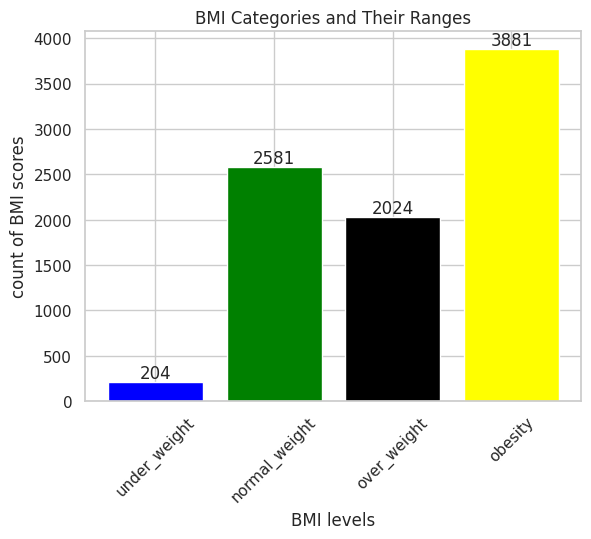

In [ ]:
# Example data
cat = ['under_weight', 'normal_weight', 'over_weight','obesity']
risk = [ len(under_weight),len(normal_weight),len(over_weight),len(obesity_bmi)]



bars = plt.bar(cat, risk, color=['blue', 'green', 'black','yellow'])


plt.xlabel('BMI levels')
plt.ylabel('count of BMI scores')
plt.title('BMI Categories and Their Ranges')
plt.xticks(rotation=45)


for bar, risk in zip(bars, risk):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, str(risk), ha='center', va='bottom')


plt.show()

In [ ]:
obesity_bmi_risk= len(obesity_bmi[obesity_bmi['Heart Attack Risk']==1])
obesity_bmi_risk

1395

In [ ]:
over_weight_risk = len(over_weight[over_weight['Heart Attack Risk']==1])
over_weight_risk

696

In [ ]:
normal_weight_risk = len(normal_weight[normal_weight['Heart Attack Risk']==1])
normal_weight_risk

961

In [ ]:
under_weight_risk = len(under_weight[under_weight['Heart Attack Risk']==1])
under_weight_risk

59

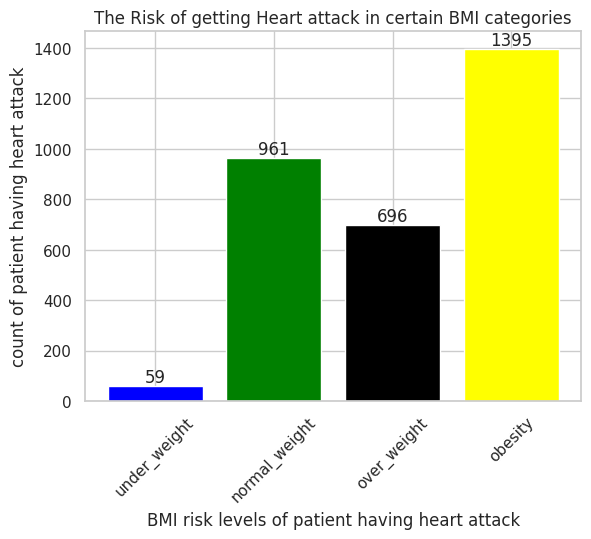

In [ ]:
cat = ['under_weight', 'normal_weight', 'over_weight','obesity']
risk = [ under_weight_risk,normal_weight_risk,over_weight_risk,obesity_bmi_risk]



bars = plt.bar(cat, risk, color=['blue', 'green', 'black','yellow'])


plt.xlabel('BMI risk levels of patient having heart attack')
plt.ylabel('count of patient having heart attack')
plt.title('The Risk of getting Heart attack in certain BMI categories')
plt.xticks(rotation=45)


for bar, risk in zip(bars, risk):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, str(risk), ha='center', va='bottom')

In [ ]:
len(df[(df['Obesity']==1) & (df['Heart Attack Risk']==1)])

1546

**Heart Attack Risk with Obesity:**
* Individuals marked as obese in the 'Obesity' column and at risk of a heart attack: 1546 out of 4394

**Conclusion:**
A considerable number of individuals marked as obese in the 'Obesity' column (35.2%) are at risk of a heart attack. This indicates a strong correlation between obesity and heart attack risk. The common cases further highlight the overlap between the two criteria

In [ ]:
len(df[df['Obesity']==1])

4394

In [ ]:
obesity_bmi=df[df['BMI']>=30]
len(obesity_bmi)

3881

**Discrepancies in Obesity and BMI Classifications**
*  Total Individuals Classified as Obese:
      *    Based on the 'Obesity' column: 4394
      *   Based on BMI > 30: 3881

In [ ]:
obesity_mismatch = df[(df['Obesity'] == 1) & (df['BMI'] <= 30)]
len(obesity_mismatch)

2489

In [ ]:
non_obesity_mismatch = df[(df['Obesity'] == 0) & (df['BMI'] > 30)]
len(non_obesity_mismatch)

1976


**Mismatches:**
* Individuals marked as obese in the 'Obesity' column but with BMI ≤ 30: 2489
* Individuals with BMI > 30 but not marked as obese in the 'Obesity' column: 1976


In [ ]:
common_obesity_risk = len(df[(df['Obesity'] == 1) & (df['BMI'] >= 30) & (df['Heart Attack Risk'] == 1)])
common_obesity_risk

685

**Common Cases:**
*  Individuals marked as obese in both the 'Obesity' column and BMI > 30: 685

**Conclusion:**

The discrepancies between the 'Obesity' column and BMI values suggest that the 'Obesity' column might be based on additional criteria beyond BMI, such as waist circumference, body fat percentage, or other health conditions. Given the significant number of mismatches

**Data Story Summary**

In our dataset, we have two columns, 'Obesity' and 'BMI', that provide insights into individuals' obesity status. The 'Obesity' column classifies 4394 individuals as obese, while the BMI column (with a threshold of BMI > 30) identifies 3881 individuals as obese. We observed significant discrepancies between these classifications:

*  2489 individuals are marked as obese in the 'Obesity' column but have a BMI ≤ 30.
*  1976 individuals have a BMI > 30 but are not marked as obese in the 'Obesity' column.
*  Only 685 individuals are consistently marked as obese by both criteria and also have a heart attack risk.

Despite these discrepancies, both columns provide valuable information. The 'Obesity' column might incorporate additional criteria beyond BMI, such as waist circumference or body fat percentage, which are also important indicators of health risks.

In [ ]:
df['Triglycerides']

,Triglycerides
0,286
1,235
2,587
3,378
4,231
5,795
6,284
7,370
8,790
9,232


**Triglycerides** are a type of fat (lipid) found in your blood. The body uses them for energy, but high levels can increase the risk of heart disease. It's important to monitor triglyceride levels as part of overall heart health.

In [ ]:
normal_triglycerides = df[df['Triglycerides'] < 150]
borderline_high_triglycerides = df[(df['Triglycerides'] >= 150) & (df['Triglycerides'] < 200)]
high_triglycerides = df[(df['Triglycerides'] >= 200) & (df['Triglycerides'] < 500)]
very_high_triglycerides = df[df['Triglycerides'] >= 500]

# Calculate the number of patients in each category
len_normal_triglycerides = len(normal_triglycerides)
len_borderline_high_triglycerides = len(borderline_high_triglycerides)
len_high_triglycerides = len(high_triglycerides)
len_very_high_triglycerides = len(very_high_triglycerides)

In [ ]:
# Calculate the number of patients in each category with heart attack risk
normal_triglycerides_risk = len(normal_triglycerides[normal_triglycerides['Heart Attack Risk'] == 1])
borderline_high_triglycerides_risk = len(borderline_high_triglycerides[borderline_high_triglycerides['Heart Attack Risk'] == 1])
high_triglycerides_risk = len(high_triglycerides[high_triglycerides['Heart Attack Risk'] == 1])
very_high_triglycerides_risk = len(very_high_triglycerides[very_high_triglycerides['Heart Attack Risk'] == 1])

In [ ]:
# Display the results
print("Normal Triglycerides Levels (< 150 mg/dL):")
print(f"Total patients: {len_normal_triglycerides}")
print(f"Patients with heart attack risk: {normal_triglycerides_risk}")

Normal Triglycerides Levels (< 150 mg/dL):
Total patients: 1358
Patients with heart attack risk: 496


* Patients with normal triglycerides levels make up a significant portion of the dataset, with 1,358 individuals falling into this category. However, within this group, 496 patients, which is approximately 36.5%, are still at risk of heart attack. This indicates that even normal triglycerides levels do not entirely eliminate the risk of heart attack.

In [ ]:
print("\nBorderline High Triglycerides Levels (150-199 mg/dL):")
print(f"Total patients: {len_borderline_high_triglycerides}")
print(f"Patients with heart attack risk: {borderline_high_triglycerides_risk}")


Borderline High Triglycerides Levels (150-199 mg/dL):
Total patients: 520
Patients with heart attack risk: 193


*  In the borderline high triglycerides level category, there are 520 patients. Of these, 193 are at risk of heart attack, making up around 37.1% of this subgroup. This shows that as triglycerides levels increase slightly above normal, the risk of heart attack remains significant.

In [ ]:
print("\nHigh Triglycerides Levels (200-499 mg/dL):")
print(f"Total patients: {len_high_triglycerides}")
print(f"Patients with heart attack risk: {high_triglycerides_risk}")


High Triglycerides Levels (200-499 mg/dL):
Total patients: 3450
Patients with heart attack risk: 1182


*  Patients with high triglyceride levels (200-499 mg/dL) account for a significant proportion of heart attack risks, with 1182 out of 3450 patients affected.

In [ ]:
print("\nVery High Triglycerides Levels (>= 500 mg/dL):")
print(f"Total patients: {len_very_high_triglycerides}")
print(f"Patients with heart attack risk: {very_high_triglycerides_risk}")


Very High Triglycerides Levels (>= 500 mg/dL):
Total patients: 3435
Patients with heart attack risk: 1268


*  Patients with very high triglycerides levels are the largest group, with 3,435 individuals. Among them, 1,268 patients, or approximately 36.9%, are at risk of heart attack. This indicates a substantial risk of heart attack in patients with very high triglycerides levels.

In [ ]:

# Data for plotting
categories = ['Normal', 'Borderline High', 'High', 'Very High']
total_patients = [len_normal_triglycerides, len_borderline_high_triglycerides, len_high_triglycerides, len_very_high_triglycerides]
risk_patients = [normal_triglycerides_risk, borderline_high_triglycerides_risk, high_triglycerides_risk, very_high_triglycerides_risk]

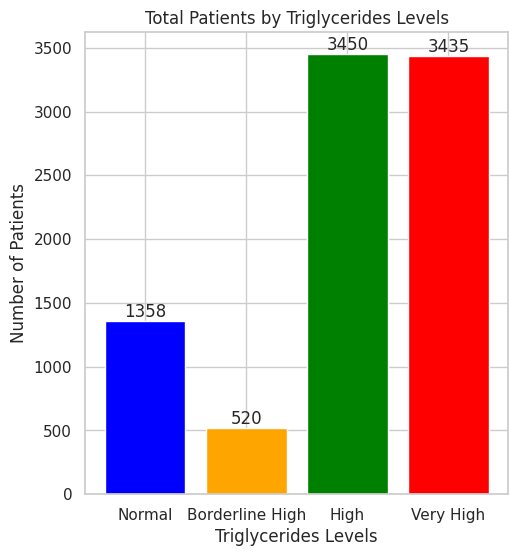

In [ ]:

# Plotting total patients in each triglycerides level category
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
bars1 = plt.bar(categories, total_patients, color=['blue', 'orange', 'green', 'red'])
plt.xlabel('Triglycerides Levels')
plt.ylabel('Number of Patients')
plt.title('Total Patients by Triglycerides Levels')

# Annotate the bars with the counts
for bar, count in zip(bars1, total_patients):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height, str(count), ha='center', va='bottom')


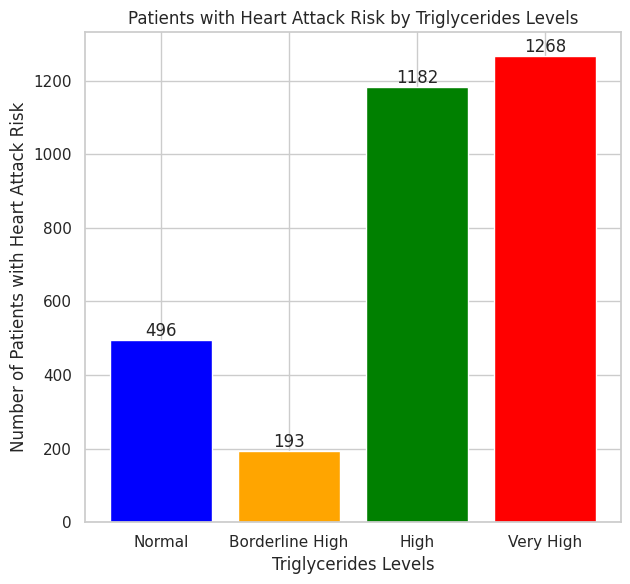

In [ ]:
# Plotting patients with heart attack risk in each triglycerides level category
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 2)
bars2 = plt.bar(categories, risk_patients, color=['blue', 'orange', 'green', 'red'])
plt.xlabel('Triglycerides Levels')
plt.ylabel('Number of Patients with Heart Attack Risk')
plt.title('Patients with Heart Attack Risk by Triglycerides Levels')


# Annotate the bars with the counts
for bar, count in zip(bars2, risk_patients):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height, str(count), ha='center', va='bottom')

plt.tight_layout()
plt.show()

*  The data shows a clear trend where higher triglyceride levels correlate with an increased likelihood of heart attack risk.
*  The data illustrates a significant association between triglyceride levels and the likelihood of heart attack risk. Addressing elevated triglyceride levels through proactive health management can play a crucial role in cardiovascular disease prevention


In [ ]:

df.describe(include='object').T

,count,unique,top,freq
Patient ID,8763,8763,BMW7812,1
Sex,8763,2,Male,6111
Blood Pressure,8763,3915,146/94,8
Diet,8763,3,Healthy,2960
Country,8763,20,Germany,477
Continent,8763,6,Asia,2543
Hemisphere,8763,2,Northern Hemisphere,5660


In [ ]:


df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,8763.0,53.707977,21.249509,18.000000,35.000000,54.000000,72.000000,90.000000
Cholesterol,8763.0,259.877211,80.863276,120.000000,192.000000,259.000000,330.000000,400.000000
Heart Rate,8763.0,75.021682,20.550948,40.000000,57.000000,75.000000,93.000000,110.000000
Diabetes,8763.0,0.652288,0.476271,0.000000,0.000000,1.000000,1.000000,1.000000
Family History,8763.0,0.492982,0.499979,0.000000,0.000000,0.000000,1.000000,1.000000
Smoking,8763.0,0.896839,0.304186,0.000000,1.000000,1.000000,1.000000,1.000000
Obesity,8763.0,0.501426,0.500026,0.000000,0.000000,1.000000,1.000000,1.000000
Alcohol Consumption,8763.0,0.598083,0.490313,0.000000,0.000000,1.000000,1.000000,1.000000
Exercise Hours Per Week,8763.0,10.014284,5.783748,0.002000,4.981500,10.070000,15.050000,19.999000
Previous Heart Problems,8763.0,0.495835,0.500011,0.000000,0.000000,0.000000,1.000000,1.000000


In [ ]:
numeric_df = df.select_dtypes(include=[np.number])

In [ ]:
correlation_matrix = numeric_df.corr()
correlation_matrix

,Age,Cholesterol,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Previous Heart Problems,...,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Heart Attack Risk,systolic_bp,diastolic_bp
Age,1.000000,-0.009107,-0.003844,-0.014105,0.008353,0.394891,-0.008140,-0.006666,0.001206,0.000868,...,0.018307,0.017280,-0.001733,-0.002612,0.003415,0.001384,-0.002185,0.006403,0.003070,-0.009826
Cholesterol,-0.009107,1.000000,0.000315,-0.013428,-0.021608,0.016342,-0.014843,-0.007261,0.021517,-0.006070,...,-0.024487,0.018914,0.000007,0.017292,-0.005454,0.016056,0.004456,0.019340,0.000133,0.002083
Heart Rate,-0.003844,0.000315,1.000000,0.006764,-0.013470,-0.012331,0.012725,0.003459,0.008277,-0.004956,...,-0.004547,-0.010232,0.004873,0.005299,0.012244,0.000834,0.001811,-0.004251,0.008482,-0.018113
Diabetes,-0.014105,-0.013428,0.006764,1.000000,-0.013844,0.000527,0.012866,0.005551,-0.007014,0.000867,...,0.006719,0.004705,-0.000759,-0.002852,0.010431,-0.002411,-0.012457,0.017225,-0.005306,-0.000512
Family History,0.008353,-0.021608,-0.013470,-0.013844,1.000000,0.011748,-0.001444,0.012701,-0.006378,-0.004568,...,0.015637,0.002561,-0.000401,-0.011492,-0.001904,0.009561,-0.011199,-0.001652,-0.009762,0.017818
Smoking,0.394891,0.016342,-0.012331,0.000527,0.011748,1.000000,0.003969,0.012754,-0.000150,-0.000574,...,-0.001757,0.015311,0.003096,0.007670,0.004650,-0.006465,-0.005424,-0.004051,-0.009534,-0.012293
Obesity,-0.008140,-0.014843,0.012725,0.012866,-0.001444,0.003969,1.000000,-0.024195,0.002098,0.005159,...,0.010626,-0.001333,-0.003870,-0.006058,0.001467,0.005337,-0.005314,-0.013318,-0.001918,-0.020574
Alcohol Consumption,-0.006666,-0.007261,0.003459,0.005551,0.012701,0.012754,-0.024195,1.000000,-0.008514,0.010395,...,-0.005023,-0.012828,-0.022396,0.010562,0.006169,0.001593,-0.000843,-0.013778,0.010764,-0.007282
Exercise Hours Per Week,0.001206,0.021517,0.008277,-0.007014,-0.006378,-0.000150,0.002098,-0.008514,1.000000,0.005253,...,-0.009104,0.008755,-0.023414,0.003777,0.001717,0.007725,-0.001245,0.011133,-0.009506,-0.003470
Previous Heart Problems,0.000868,-0.006070,-0.004956,0.000867,-0.004568,-0.000574,0.005159,0.010395,0.005253,1.000000,...,-0.017629,-0.002695,-0.003281,0.015718,-0.019029,0.008537,0.004460,0.000274,-0.011926,0.008813


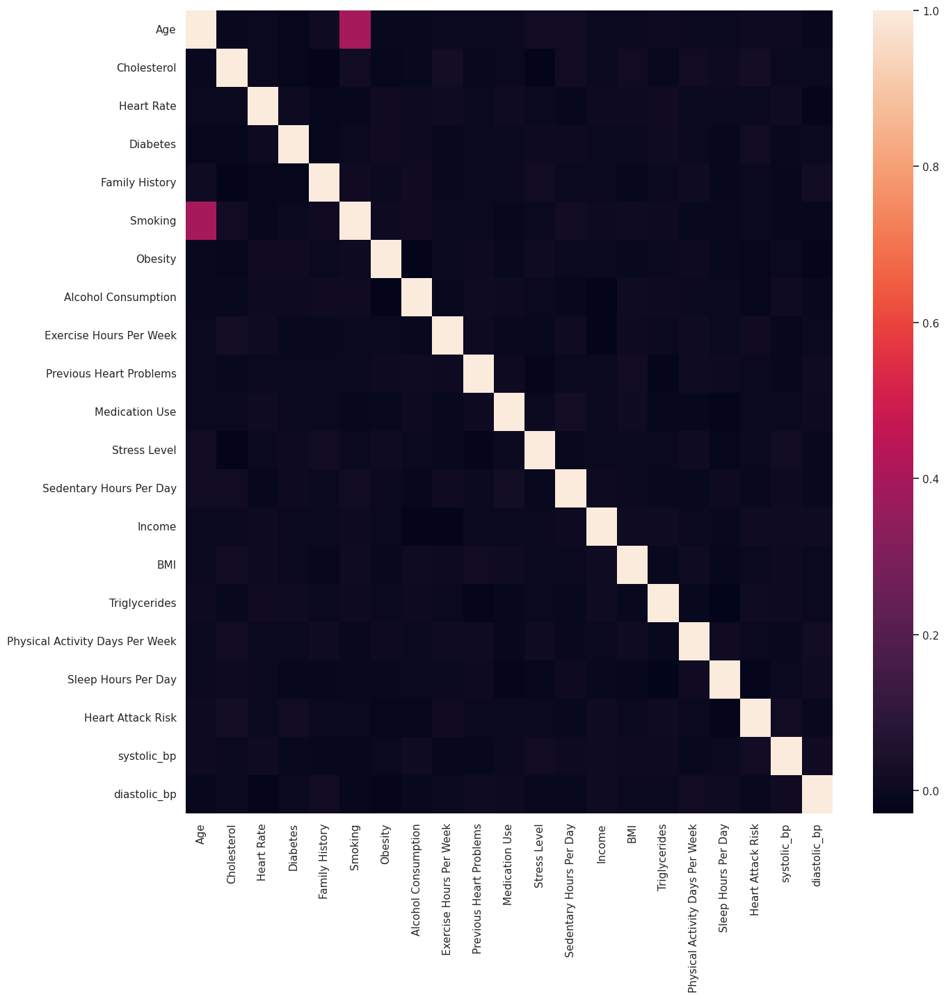

In [ ]:
plt.figure(figsize=(15,15))
sns.heatmap(correlation_matrix)
plt.show()

In [ ]:
correlation_pairs = correlation_matrix.unstack()
sorted_correlation_pairs = correlation_pairs.sort_values(kind='quicksort',key=abs,ascending=False)



In [ ]:
sorted_correlation_pairs = sorted_correlation_pairs[sorted_correlation_pairs != 1]

print("Top 10 most correlated pairs:\n", sorted_correlation_pairs.head(10))

Top 10 most correlated pairs:
 Smoking                  Age                        0.394891
Age                      Smoking                    0.394891
Sleep Hours Per Day      Triglycerides             -0.029216
Triglycerides            Sleep Hours Per Day       -0.029216
Stress Level             Cholesterol               -0.024487
Cholesterol              Stress Level              -0.024487
Alcohol Consumption      Obesity                   -0.024195
Obesity                  Alcohol Consumption       -0.024195
Exercise Hours Per Week  Income                    -0.023414
Income                   Exercise Hours Per Week   -0.023414
dtype: float64


* Upon examining the dataset, it was found that no variables demonstrate strong correlations. Most correlations were weak, with coefficients close to zero, indicating minimal linear relationships between variables. This suggests that in our dataset, factors such as age, smoking habits, sleep patterns, and others operate relatively independently of each other.

*  This insight underscores the complexity of health risk prediction, where multiple factors may contribute independently to outcomes. Future analyses may explore non-linear relationships or interactions between variables to uncover deeper insights into health risk factors.

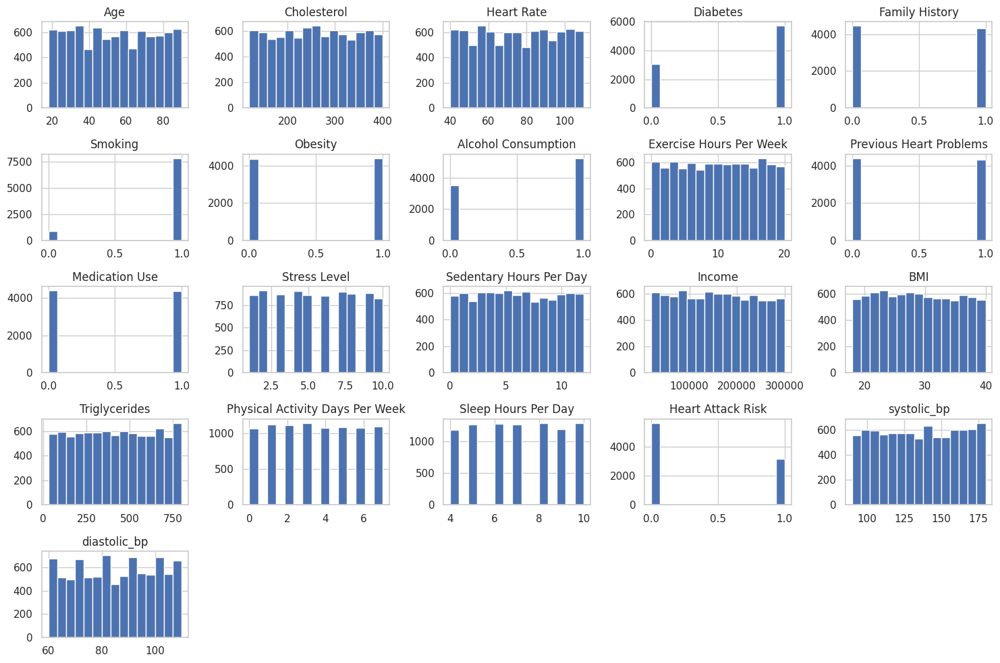

In [ ]:
num_cols = df.select_dtypes(include=[np.number]).columns.tolist()


df[num_cols].hist(bins=15, figsize=(15, 10), layout=(5, 5))
plt.tight_layout()
plt.show()

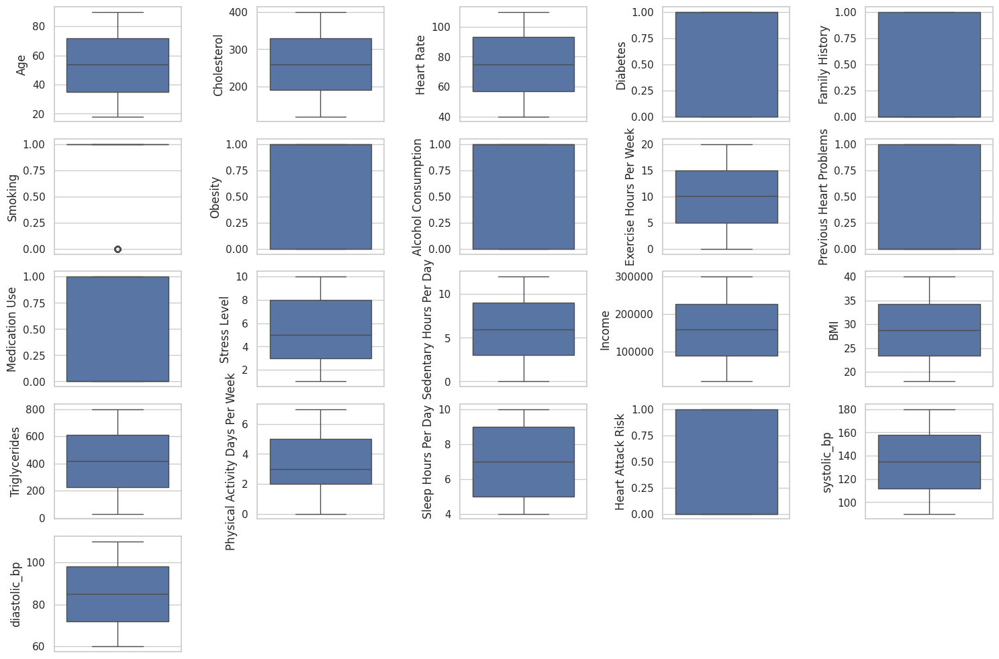

In [ ]:
plt.figure(figsize=(15,10))

for i ,col in enumerate(num_cols):
  plt.subplot(5,5,i+1)
  sns.boxplot(y=df[col])
plt.tight_layout()
plt.show()

## **Checking Skewness and Kurtosis**

In [ ]:
from scipy.stats import skew, kurtosis

# Assuming 'df' is your DataFrame
numeric_df = df.select_dtypes(include=[np.number])

# Calculate skewness and kurtosis
skewness = numeric_df.apply(lambda x: skew(x.dropna()))
kurt = numeric_df.apply(lambda x: kurtosis(x.dropna()))

# Print skewness and kurtosis
print("Skewness:\n", skewness)
print("Kurtosis:\n", kurt)

Skewness:
 Age                                0.028493
Cholesterol                       -0.000955
Heart Rate                        -0.003227
Diabetes                          -0.639538
Family History                     0.028075
Smoking                           -2.609332
Obesity                           -0.005706
Alcohol Consumption               -0.400105
Exercise Hours Per Week           -0.016383
Previous Heart Problems            0.016662
Medication Use                     0.006619
Stress Level                       0.008388
Sedentary Hours Per Day            0.017972
Income                             0.021788
BMI                                0.035990
Triglycerides                     -0.001915
Physical Activity Days Per Week    0.017819
Sleep Hours Per Day                0.000357
Heart Attack Risk                  0.591436
systolic_bp                       -0.002661
diastolic_bp                      -0.023371
dtype: float64
Kurtosis:
 Age                               -1.21

In [ ]:
for col in numeric_df.columns:
    skew_val = skew(numeric_df[col].dropna())
    kurt_val = kurtosis(numeric_df[col].dropna())

    # Categorize skewness
    if skew_val > 0:
        print(f"{col}: Positive Skew")
    elif skew_val < 0:
        print(f"{col}: Negative Skew")
    else:
        print(f"{col}: Zero Skew")

        # Categorize kurtosis
    if kurt_val > 0:
        print(f"{col}: Leptokurtic (Positive Kurtosis)")
    elif kurt_val < 0:
        print(f"{col}: Platykurtic (Negative Kurtosis)")
    else:
        print(f"{col}: Mesokurtic (Zero Kurtosis)")


Age: Positive Skew
Age: Platykurtic (Negative Kurtosis)
Cholesterol: Negative Skew
Cholesterol: Platykurtic (Negative Kurtosis)
Heart Rate: Negative Skew
Heart Rate: Platykurtic (Negative Kurtosis)
Diabetes: Negative Skew
Diabetes: Platykurtic (Negative Kurtosis)
Family History: Positive Skew
Family History: Platykurtic (Negative Kurtosis)
Smoking: Negative Skew
Smoking: Leptokurtic (Positive Kurtosis)
Obesity: Negative Skew
Obesity: Platykurtic (Negative Kurtosis)
Alcohol Consumption: Negative Skew
Alcohol Consumption: Platykurtic (Negative Kurtosis)
Exercise Hours Per Week: Negative Skew
Exercise Hours Per Week: Platykurtic (Negative Kurtosis)
Previous Heart Problems: Positive Skew
Previous Heart Problems: Platykurtic (Negative Kurtosis)
Medication Use: Positive Skew
Medication Use: Platykurtic (Negative Kurtosis)
Stress Level: Positive Skew
Stress Level: Platykurtic (Negative Kurtosis)
Sedentary Hours Per Day: Positive Skew
Sedentary Hours Per Day: Platykurtic (Negative Kurtosis)
In

*  Our dataset shows a mix of skewness and kurtosis across various health-related variables. Most variables, including Age, Cholesterol, and Heart Rate, exhibit platykurtic distributions, indicating fewer extreme values and a flatter shape than the normal distribution. Notably, the Smoking variable is highly leptokurtic, suggesting a sharp peak and heavy tails, with more extreme values. Skewness is mostly minimal, with a few exceptions like Smoking (highly negatively skewed) and Heart Attack Risk (moderately positively skewed). These patterns highlight the need for potential transformations and careful handling of outliers in specific variables to ensure accurate analysis and modeling.

* **Kurtosis Range:** Most values fall between -1 and -2, indicating a platykurtic distribution.
*  **Platykurtic Distribution:** This means that the data has lighter tails and a flatter peak compared to a normal distribution. In practical terms, it implies fewer outliers than a normal distribution.

## **Data Preprocessing**

In [ ]:
df.isnull().sum()

,0
Patient ID,0
Age,0
Sex,0
Cholesterol,0
Blood Pressure,0
Heart Rate,0
Diabetes,0
Family History,0
Smoking,0
Obesity,0


*  There is no null values in the dataset

In [ ]:
df.duplicated().sum()

0

*  There is no duplicates in the Data set

In [ ]:
df.columns

Index(['Patient ID', 'Age', 'Sex', 'Cholesterol', 'Blood Pressure',
       'Heart Rate', 'Diabetes', 'Family History', 'Smoking', 'Obesity',
       'Alcohol Consumption', 'Exercise Hours Per Week', 'Diet',
       'Previous Heart Problems', 'Medication Use', 'Stress Level',
       'Sedentary Hours Per Day', 'Income', 'BMI', 'Triglycerides',
       'Physical Activity Days Per Week', 'Sleep Hours Per Day', 'Country',
       'Continent', 'Hemisphere', 'Heart Attack Risk', 'systolic_bp',
       'diastolic_bp'],
      dtype='object')

In [ ]:
df.shape

(8763, 28)

##  Removing unnecessary columns

In [ ]:
columns_to_drop = ['Patient ID', 'Country', 'Continent', 'Hemisphere', 'Income',]


df = df.drop(columns=columns_to_drop)


In [ ]:
columns_to_drop= ['Physical Activity Days Per Week', 'Sleep Hours Per Day']

df = df.drop(columns=columns_to_drop)

In [ ]:
df.shape

(8763, 21)

*  **Patient ID:** Typically, an identifier and not directly relevant to predictive modeling unless dealing with patient-specific characteristics not captured by other variables.

*  **Country, Continent, Hemisphere:** Unless geographic location plays a significant role in your analysis (e.g., due to regional health disparities), these may not directly impact heart attack risk prediction.

*  **Income:** While socioeconomic factors can influence health outcomes, it might not be directly related to heart attack risk prediction unless explored in-depth for specific correlations.



*  removed the columns '**Physical Activity Days Per Week'** and **'Sleep Hours Per Day'** because they were not significantly contributing to the model's performance, and their removal helped streamline the dataset for more efficient analysis.

In [ ]:
df = df.drop('Blood Pressure',axis=1)

*  The 'Blood Pressure' column was dropped because separate columns for systolic and diastolic blood pressure were created, making the dataset clearer and more focused on specific cardiovascular risk factors.

In [ ]:
df.shape

(8763, 20)

In [ ]:
from scipy import stats

## **Outlier Detection**

In [ ]:

numeric_df = df.select_dtypes(include=[np.number])

z_scores = np.abs(stats.zscore(numeric_df))


outliers = np.where((z_scores > 3) | (z_scores < -3))

print("Outliers detected using Z-score method:", outliers)

Outliers detected using Z-score method: (array([], dtype=int64), array([], dtype=int64))


In [ ]:
print("Outliers detected using Z-score method:", outliers)

Outliers detected using Z-score method: (array([], dtype=int64), array([], dtype=int64))


*   The output indicates that there are no outliers detected using the Z-score method, as both arrays are empty. This result aligns with our earlier observation that there were no outliers in the dataset according to the box plots.

**Summary:**
* **Box Plot Method:** No outliers detected.
* **Z-Score Method:** No outliers detected.

In [ ]:

def detect_outliers_iqr(df):
    Q1 = df.quantile(0.25)
    Q3 = df.quantile(0.75)
    IQR = Q3 - Q1

    # Identifying outliers
    outliers = (df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))
    return outliers



In [ ]:
outliers = pd.DataFrame()
for col in df.select_dtypes(include=[np.number]).columns:
    outliers[col] = detect_outliers_iqr(df[col])

In [ ]:
# Summarize the number of outliers in each column
outliers_summary = outliers.sum()
print("Number of outliers in each column:")
print(outliers_summary)

# Verify if there are any outliers
if outliers_summary.sum() == 0:
    print("No outliers detected using the IQR method.")
else:
    print("Outliers detected using the IQR method.")

Number of outliers in each column:
Age                          0
Cholesterol                  0
Heart Rate                   0
Diabetes                     0
Family History               0
Smoking                    904
Obesity                      0
Alcohol Consumption          0
Exercise Hours Per Week      0
Previous Heart Problems      0
Medication Use               0
Stress Level                 0
Sedentary Hours Per Day      0
BMI                          0
Triglycerides                0
Heart Attack Risk            0
systolic_bp                  0
diastolic_bp                 0
dtype: int64
Outliers detected using the IQR method.


## **Impact of Binary Distribution on Skewness and Kurtosis:(Smoking)**

*  Given that the "Smoking" column is binary (0 and 1), the skewness and kurtosis values might change due to the distribution of these values within the dataset. Skewness can still be affected by the imbalance between the two classes (0s and 1s), especially if there is a disproportionate number of one class compared to the other. Kurtosis, on the other hand, might reflect the peakedness or flatness of the distribution, which can be influenced by how these binary values are spread across the dataset.

## **Comparison of Outlier Detection Methods:(smoking)**



*  The Z-score method identifies outliers based on standard deviations from the mean, which may not effectively capture outliers in binary data like the 'Smoking' column, where values are predominantly 0s and 1s. In contrast, the IQR (Interquartile Range) method is less sensitive to the distribution shape and focuses on the spread of data around the median, making it more suitable for detecting outliers in binary or skewed data. Therefore, while the Z-score method may not flag outliers in binary columns, the IQR method can detect deviations from the central tendency more effectively, which is why outliers were observed in the 'Smoking' column using IQR analysis

In [ ]:
from scipy.stats import skew, kurtosis, boxcox

## **Categorical columns encoding**

In [ ]:

X = df.drop(columns=['Heart Attack Risk'])
y = df['Heart Attack Risk']

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [ ]:

object_columns = X.select_dtypes(include=['object']).columns
object_columns

Index(['Sex', 'Diet'], dtype='object')

In [ ]:
categorical_columns_x =  X[object_columns]

In [ ]:
categorical_columns_x

,Sex,Diet
0,Male,Average
1,Male,Unhealthy
2,Female,Healthy
3,Male,Average
4,Male,Unhealthy
...,...,...
8758,Male,Healthy
8759,Female,Healthy
8760,Male,Average
8761,Male,Unhealthy


In [ ]:
X.drop(['Sex', 'Diet'],axis=1,inplace=True)


In [ ]:


X.shape

(8763, 17)

In [ ]:
enocded_cate_x = pd.get_dummies(categorical_columns_x,drop_first=True).astype(int)

In [ ]:
df['Diet'].value_counts()

,count
Diet,
Healthy,2960
Average,2912
Unhealthy,2891


In [ ]:
enocded_cate_x

,Sex_Male,Diet_Healthy,Diet_Unhealthy
0,1,0,0
1,1,0,1
2,0,1,0
3,1,0,0
4,1,0,1
...,...,...,...
8758,1,1,0
8759,0,1,0
8760,1,0,0
8761,1,0,1


In [ ]:
X = pd.concat([X,enocded_cate_x], axis=1)

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Age                      8763 non-null   int64  
 1   Cholesterol              8763 non-null   int64  
 2   Heart Rate               8763 non-null   int64  
 3   Diabetes                 8763 non-null   int64  
 4   Family History           8763 non-null   int64  
 5   Smoking                  8763 non-null   int64  
 6   Obesity                  8763 non-null   int64  
 7   Alcohol Consumption      8763 non-null   int64  
 8   Exercise Hours Per Week  8763 non-null   float64
 9   Previous Heart Problems  8763 non-null   int64  
 10  Medication Use           8763 non-null   int64  
 11  Stress Level             8763 non-null   int64  
 12  Sedentary Hours Per Day  8763 non-null   float64
 13  BMI                      8763 non-null   float64
 14  Triglycerides           

In [ ]:
X.shape

(8763, 20)

## **Numerical columns scaling**

In [ ]:
X.shape

(8763, 20)

In [ ]:
# Identify binary columns (excluding the target variable)

binary_cols = X.columns[(X.nunique() == 2)].tolist()
continuous_cols = [col for col in X.columns if col not in binary_cols]



In [ ]:
X.columns

Index(['Age', 'Cholesterol', 'Heart Rate', 'Diabetes', 'Family History',
       'Smoking', 'Obesity', 'Alcohol Consumption', 'Exercise Hours Per Week',
       'Previous Heart Problems', 'Medication Use', 'Stress Level',
       'Sedentary Hours Per Day', 'BMI', 'Triglycerides', 'systolic_bp',
       'diastolic_bp', 'Sex_Male', 'Diet_Healthy', 'Diet_Unhealthy'],
      dtype='object')

In [ ]:
continuous_cols

['Age',
 'Cholesterol',
 'Heart Rate',
 'Exercise Hours Per Week',
 'Stress Level',
 'Sedentary Hours Per Day',
 'BMI',
 'Triglycerides',
 'systolic_bp',
 'diastolic_bp']

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X[continuous_cols] = scaler.fit_transform(X[continuous_cols])

In [ ]:
X.T

,0,1,2,3,4,5,6,7,8,9,...,8753,8754,8755,8756,8757,8758,8759,8760,8761,8762
Age,0.625557,-1.539322,-1.539322,1.425621,0.578495,0.013743,1.707997,1.425621,-1.586385,-0.503945,...,1.331496,1.237371,-1.351072,-1.492260,0.249056,0.296119,-1.209884,-0.315695,-0.833383,-1.351072
Cholesterol,-0.641579,1.596895,0.793023,1.522691,0.718820,0.459107,1.213510,-0.493172,-1.420716,-0.146889,...,0.632249,1.522691,0.582780,1.077470,1.460855,-1.717530,-1.729898,-0.122154,-1.012597,1.188775
Heart Rate,-0.147042,1.118179,-0.147042,-0.098380,0.874867,-1.314938,0.436906,1.556140,-0.341691,-0.974302,...,0.582893,0.777542,0.144932,1.604802,1.166841,-0.682328,-0.098380,1.458815,-0.730990,-0.001055
Diabetes,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000
Family History,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000
Smoking,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000
Obesity,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,...,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000
Alcohol Consumption,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000
Exercise Hours Per Week,-1.010870,-1.418069,-1.372248,-0.032210,-0.727992,-1.623484,-1.022974,-1.138822,1.185063,-1.697834,...,-0.313359,-0.679751,-1.165796,-1.070869,-1.410288,-0.362637,1.131462,-1.187236,-1.076229,1.394974
Previous Heart Problems,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000


# **Addressing the Class imbalance (using Smote)**

In [ ]:
y.value_counts()

,count
Heart Attack Risk,
0,5624
1,3139


In [ ]:
for col in X.columns:
    if X[col].nunique() == 2:
        print(f"Column: {col}")
        print(X[col].value_counts())
        print()  # Adds a blank line for better readability



Column: Diabetes
Diabetes
1    5716
0    3047
Name: count, dtype: int64

Column: Family History
Family History
0    4443
1    4320
Name: count, dtype: int64

Column: Smoking
Smoking
1    7859
0     904
Name: count, dtype: int64

Column: Obesity
Obesity
1    4394
0    4369
Name: count, dtype: int64

Column: Alcohol Consumption
Alcohol Consumption
1    5241
0    3522
Name: count, dtype: int64

Column: Previous Heart Problems
Previous Heart Problems
0    4418
1    4345
Name: count, dtype: int64

Column: Medication Use
Medication Use
0    4396
1    4367
Name: count, dtype: int64

Column: Sex_Male
Sex_Male
1    6111
0    2652
Name: count, dtype: int64

Column: Diet_Healthy
Diet_Healthy
0    5803
1    2960
Name: count, dtype: int64

Column: Diet_Unhealthy
Diet_Unhealthy
0    5872
1    2891
Name: count, dtype: int64



In [ ]:
smote = SMOTE(
        sampling_strategy='auto',

        random_state=0,
        k_neighbors=5,
        n_jobs=4)
X_resampled, y_resampled = smote.fit_resample(X, y)

/usr/local/lib/python3.10/dist-packages/imblearn/over_sampling/_smote/base.py:370: FutureWarning: The parameter `n_jobs` has been deprecated in 0.10 and will be removed in 0.12. You can pass an nearest neighbors estimator where `n_jobs` is already set instead.
  warnings.warn(



## **Data Splitting**

In [ ]:
x_train,x_test,y_train,y_test = train_test_split(X_resampled, y_resampled,test_size=0.3,random_state=42)

In [ ]:
x_train.shape , y_train.shape

((7873, 20), (7873,))

In [ ]:
y_train.shape

(7873,)

# **Model Selection**

In [ ]:
models = {
    'RandomForest': RandomForestClassifier(n_estimators=200, max_depth=None, min_samples_split=5, min_samples_leaf=2, class_weight='balanced', random_state=42),
    'GradientBoosting': GradientBoostingClassifier(n_estimators=200, learning_rate=0.05, max_depth=3, min_samples_leaf=5, random_state=42),
    'LogisticRegression': LogisticRegression(C=0.1, class_weight='balanced', solver='liblinear', random_state=42),
    'SVM': SVC(C=1.0, kernel='rbf', class_weight='balanced', probability=True, random_state=42),
    'KNeighbors': KNeighborsClassifier(n_neighbors=15, weights='distance'),
    'AdaBoost': AdaBoostClassifier(n_estimators=100, random_state=42),
    'NaiveBayes': GaussianNB()
}


## **Performance Metrics**
*  The performance of each model was measured using the following metrics:

* Cross-Validation Accuracy: Average accuracy across multiple folds.
* Train Accuracy: Accuracy on the training set.
* Test Accuracy: Accuracy on the test set.
* Test Precision: Proportion of positive identifications that were actually correct.
* Test Recall: Proportion of actual positives that were identified correctly.
* Test F1 Score: Harmonic mean of precision and recall.
* Test Confusion Matrix: Number of true positives, true negatives, false positives, and false negatives

###  **Function to evaluate the model based on different metrics**

In [ ]:

def evaluate_model(model, X_train, y_train, X_test, y_test):
    # Fit the model
    model.fit(X_train, y_train)

    # Predict on training data
    y_train_pred = model.predict(X_train)

    # Predict on test data
    y_test_pred = model.predict(X_test)

    # Evaluation on training data
    accuracy_train = accuracy_score(y_train, y_train_pred)
    precision_train = precision_score(y_train, y_train_pred)
    recall_train = recall_score(y_train, y_train_pred)
    f1_train = f1_score(y_train, y_train_pred)

    # Evaluation on test data
    accuracy_test = accuracy_score(y_test, y_test_pred)
    precision_test = precision_score(y_test, y_test_pred)
    recall_test = recall_score(y_test, y_test_pred)
    f1_test = f1_score(y_test, y_test_pred)

    confusion_matrix1=confusion_matrix(y_test, y_test_pred)
    print(f"Train Accuracy: {accuracy_train:.4f}")
    print(f"Train Precision: {precision_train:.4f}")
    print(f"Train Recall: {recall_train:.4f}")
    print(f"Train F1 Score: {f1_train:.4f}")

    print(f"Test Accuracy: {accuracy_test:.4f}")
    print(f"Test Precision: {precision_test:.4f}")
    print(f"Test Recall: {recall_test:.4f}")
    print(f"Test F1 Score: {f1_test:.4f}")
    print(f"Test Confusion Matrix:{confusion_matrix1}")
    return {
        'accuracy_train': accuracy_train,
        'precision_train': precision_train,
        'recall_train': recall_train,
        'f1_train': f1_train,
        'accuracy_test': accuracy_test,
        'precision_test': precision_test,
        'recall_test': recall_test,
        'f1_test': f1_test,
        'confusion_matrix':confusion_matrix1
    }

In [ ]:
from sklearn.metrics import accuracy_score

In [ ]:
# Evaluate each model with cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
results = {}

for model_name, model in models.items():
    print(f"\n{model_name} Evaluation:")
    cv_scores = cross_val_score(model, x_train, y_train, cv=cv, scoring='accuracy', n_jobs=-1)
    print(f"Cross-Validation Accuracy: {cv_scores.mean():.4f} ± {cv_scores.std():.4f}")
    results[model_name] = evaluate_model(model, x_train, y_train, x_test, y_test)






RandomForest Evaluation:
Cross-Validation Accuracy: 0.6718 ± 0.0042
Train Accuracy: 1.0000
Train Precision: 1.0000
Train Recall: 1.0000
Train F1 Score: 1.0000
Test Accuracy: 0.6978
Test Precision: 0.7160
Test Recall: 0.6594
Test F1 Score: 0.6865
Test Confusion Matrix:[[1238  443]
 [ 577 1117]]

GradientBoosting Evaluation:
Cross-Validation Accuracy: 0.6558 ± 0.0129
Train Accuracy: 0.7199
Train Precision: 0.8025
Train Recall: 0.5822
Train F1 Score: 0.6748
Test Accuracy: 0.6516
Test Precision: 0.7169
Test Recall: 0.5053
Test F1 Score: 0.5928
Test Confusion Matrix:[[1343  338]
 [ 838  856]]

LogisticRegression Evaluation:
Cross-Validation Accuracy: 0.5642 ± 0.0069
Train Accuracy: 0.5700
Train Precision: 0.5711
Train Recall: 0.5570
Train F1 Score: 0.5640
Test Accuracy: 0.5719
Test Precision: 0.5750
Test Recall: 0.5632
Test F1 Score: 0.5690
Test Confusion Matrix:[[976 705]
 [740 954]]

SVM Evaluation:
Cross-Validation Accuracy: 0.5930 ± 0.0110
Train Accuracy: 0.7128
Train Precision: 0.7158

## **Selection of Random Forest**
* Based on the evaluation metrics, the Random Forest classifier demonstrated the highest test accuracy (0.6978) and a balanced performance in precision, recall, and F1 score. The model also showed relatively consistent cross-validation accuracy (0.6718 ± 0.0042), indicating its reliability. Despite the perfect training accuracy, suggesting overfitting, Random Forest's performance on the test set was superior compared to other models, which justified its selection for further refinement

## **Refining Random Forest to Reduce Overfitting**

*  **To address the overfitting observed in the initial Random Forest model, we adjusted hyperparameters to strike a balance between bias and variance. We implemented two refined versions of the model:**

In [ ]:
rf1 = RandomForestClassifier(
    n_estimators=200,
    max_depth=10,  # reduced depth
    min_samples_split=10,  # increased minimum samples to split
    min_samples_leaf=5,  # increased minimum samples at leaf
    max_features='sqrt',  # use sqrt of the number of features
    class_weight='balanced',  # account for any imbalance
    random_state=42
)

# Fit the model
rf1.fit(x_train, y_train)



results = evaluate_model(rf1, x_train, y_train, x_test, y_test)



Train Accuracy: 0.8704
Train Precision: 0.8570
Train Recall: 0.8888
Train F1 Score: 0.8726
Test Accuracy: 0.6406
Test Precision: 0.6427
Test Recall: 0.6393
Test F1 Score: 0.6410
Test Confusion Matrix:[[1079  602]
 [ 611 1083]]


In [ ]:
rf2 = RandomForestClassifier(
    n_estimators=150,  # slightly reduced number of trees
    max_depth=8,  # slightly reduced depth
    min_samples_split=15,  # increased minimum samples to split
    min_samples_leaf=7,  # increased minimum samples at leaf
    max_features='sqrt',  # use sqrt of the number of features
    class_weight='balanced',  # account for any imbalance
    random_state=42
)

# Fit the model on the entire training data
rf2.fit(x_train, y_train)

results = evaluate_model(rf2, x_train, y_train, x_test, y_test)





Train Accuracy: 0.7735
Train Precision: 0.7701
Train Recall: 0.7789
Train F1 Score: 0.7744
Test Accuracy: 0.6276
Test Precision: 0.6306
Test Recall: 0.6228
Test F1 Score: 0.6267
Test Confusion Matrix:[[1063  618]
 [ 639 1055]]


## **Conclusion**

*  **Model Selected : Rf1**

*  The refined Random Forest models, particularly RF1, exhibited a better balance between training and testing performance, reducing overfitting while maintaining reasonable accuracy.

In [ ]:
y_test_pred =  rf1.predict(x_test)

In [ ]:
def plot_confusion_matrix(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

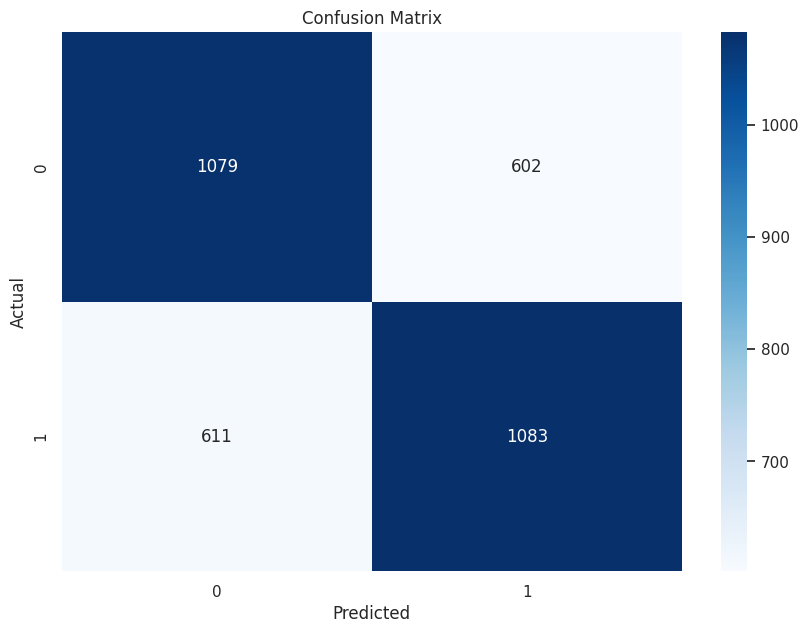

In [ ]:
# Plotting the confusion matrix for rf1
plot_confusion_matrix(y_test, y_test_pred)

# **Saving the Model**

In [ ]:
import joblib


In [ ]:
model_filename = 'heart_attack_risk_model.pkl'
joblib.dump(rf1, model_filename)

"model_filename = 'heart_attack_risk_model.pkl'\njoblib.dump(rf1, model_filename)"

In [ ]:
loaded_model = joblib.load(model_filename)

# **limitations**

*  Irrelevant or Random Data: Irrelevant features can reduce model efficiency.
*  Insufficient Data: More data could improve the robustness of the model.
*  Imbalanced Data: Disproportionate class distribution can bias the model toward the majority class.

# **Future Work:**

1. Collect more data to improve model robustness and accuracy.
2. Experiment with different algorithms, including deep learning methods.
3. Update the model periodically to maintain its accuracy over time.
5. Add more features that could improve the prediction power of the model.


# **Feature Importance**

Top 10 Features by Importance:
                    Feature  Importance
11             Stress Level    0.095563
13                      BMI    0.088698
1               Cholesterol    0.087054
14            Triglycerides    0.086330
16             diastolic_bp    0.083010
8   Exercise Hours Per Week    0.082746
12  Sedentary Hours Per Day    0.080876
2                Heart Rate    0.076606
0                       Age    0.076442
15              systolic_bp    0.076023


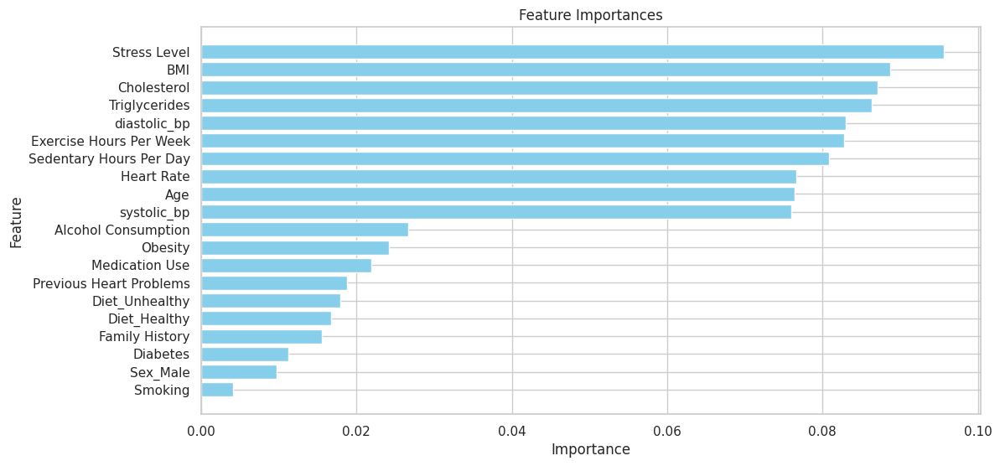

In [701]:
# Extract feature importances from the model
feature_importances = rf1.feature_importances_


features_df = pd.DataFrame({
    'Feature': x_train.columns,
    'Importance': feature_importances
})

# Sort the DataFrame by importance
features_df = features_df.sort_values(by='Importance', ascending=False)


print("Top 10 Features by Importance:")
print(features_df.head(10))

# Plot the feature importances
plt.figure(figsize=(12, 6))
plt.barh(features_df['Feature'], features_df['Importance'], color='skyblue')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances')
plt.gca().invert_yaxis()
plt.show()

**Our model for predicting heart disease shows that how we live our lives is just as important as medical tests. Stress is the biggest factor, followed by weight, cholesterol, and fat in the blood. How much we exercise and sit around also matters a lot for heart health. Blood pressure is still important, but surprisingly, age doesn't matter as much as we might think. All these factors are about equally important, each contributing between 7-10% to the prediction. This means there's no single thing that determines heart disease risk - it's a mix of many factors. To stay heart-healthy, we need to look at the whole picture: managing stress, staying active, and keeping an eye on things like cholesterol and blood pressure. This helps doctors better judge who might get heart disease and helps people know how to lower their risk.**

# **Predicting with the Unseen data**

In [699]:
# Define numerical features
numerical_features = ['Age', 'Cholesterol', 'Heart Rate', 'Exercise Hours Per Week', 'Stress Level',
                      'Sedentary Hours Per Day', 'BMI', 'Triglycerides', 'systolic_bp', 'diastolic_bp']

# Unseen data with healthier values
new_data = pd.DataFrame({
    'Age': [35], 'Cholesterol': [180], 'Heart Rate': [70], 'Diabetes': [0],
    'Family History': [0], 'Smoking': [0], 'Obesity': [0], 'Alcohol Consumption': [0],
    'Exercise Hours Per Week': [5], 'Previous Heart Problems': [0], 'Medication Use': [0],
    'Stress Level': [3], 'Sedentary Hours Per Day': [2], 'BMI': [22.5],
    'Triglycerides': [130], 'systolic_bp': [120], 'diastolic_bp': [80],
    'Sex_Male': [1], 'Diet_Healthy': [1], 'Diet_Unhealthy': [0]
})

# Fit scaler on training data and transform new data
scaler.fit(X[numerical_features])
new_data[numerical_features] = scaler.transform(new_data[numerical_features])

# Predict using the transformed new data
predicted_class = rf1.predict(new_data)

print("Predicted class:", predicted_class[0])


Predicted class: 0
